# Homework #2
Due 11:59 pm EST, Tuesday March 1st, 2022.

Email your solutions (both .ipnb and .html files) to: compscbio@gmail.com.

### Background:

You have just joined a new lab that is interested in the mammalian cell cycle. During lab meeting, you mentioned that you are taking a class that purports to teach you how to analyze scRNAseq data, and thereby you unwittingly 'volunteered' to close a project that a departing postdoc left unfinished. The postdoc was trying (1) to determine the extent to which cell cycle is impacted by stage of differentiation, and (2) to identify novel genes associated with cell cycle. To do so, this postdoc sampled mouse embryonic stem cells (mESCs) undergoing directed differerentation to mesoderm every 24 hours for five days and subjected these cells to scRNAseq via the 10x Genomics system. However, before the data could be analyzed, the postdoc got an offer in the private sector that could not be refused.  The PI of the lab knows that you are amazing, and expects you to work some magic in on the data to address the following questions:

<uL>
<LI>A) To what extent do the proportion of cells at each stage of cell cycle (CC) differ during directed differentiation?

<LI>B) What novel genes are associated with CC?

<LI>C) To what extent do these novel cell cycle genes vary across stages of differentiation?
    </ul>

However, because you are a relative newbie to this task, you want to use this project as an opportunity to also explore how the data cleaning steps impact the final results. Therefore, to recevie full credit, you will also need to answer the following question:

<ul>    
<LI>D) How do the various 'cleaning' steps outlined in class impact the results of (A-C)?
    </ul>
    
### Two wrinkles, or unfortunate things
One thing that makes analysis of this data problematic is that the sample annotation table has been lost. This means that you do not know, *a priori*, at which day of differentiation each cell was sampled. However, your lab has studied this system before and they know a handful of genes that are up-regulated specifcially at each stage of differentiation.

The other problem has to do with how this experiment is performed. Often, mESCs are maintained and expanded on a layer of mouse embryonic fibroblasts (MEFs), which help to maintain self-renewal. MEFs are mitotically inactivated either chemically or via irradiation, so they never outgrow the mESCs during passage. When mESCs are prepared for directed differentiation, MEFs are depleted via an imperfect method such that some MEFs remain at the onset of the differentiation protocol. This means some MEFs are likely to have been sequenced in this experiment and you should exclude them *in silico* prior to downstream analysis.


### The data
[scRNAseq in the form of an h5ad file](https://compstemcellbio.s3.amazonaws.com/2022/homework/02/adHW2.h5ad)
This is the raw counts data. No data cleaning has been performed on it. There are 2,201 cells and 31,065 genes.

### Gene lists
[naive pluripotency](https://compstemcellbio.s3.amazonaws.com/2022/homework/02/genes_naive.csv)
Genes preferentially expressed in undifferentiated mESCs.

[primed pluripotency](https://compstemcellbio.s3.amazonaws.com/2022/homework/02/genes_primed.csv)
Genes preferentially expressed in mESCs primed for differentiation.

[primitive streak](https://compstemcellbio.s3.amazonaws.com/2022/homework/02/genes_primitive_streak.csv)
Genes preferentially expressed in the primitive streak.

[mesoderm](https://compstemcellbio.s3.amazonaws.com/2022/homework/02/genes_mesoderm.csv)
Genes preferentially expressed in the nascent mesoderm.

[MEF](https://compstemcellbio.s3.amazonaws.com/2022/homework/02/genes_fibroblasts.csv)
Genes preferentially expressed in fibroblasts.

[cell cycle](https://compstemcellbio.s3.amazonaws.com/2022/resources/mouseCellCycle_050218.csv)
This is the same gene list that we covered in [lecture 7](https://compscbio.github.io/docs/html/day/07_scRNAseq_analysis_part_2.html)

### Your mission: Part 1

Load the data, identify contaminating MEFs, and remove them

*This section is from the scRNAseq lectures on the website*

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import scipy as sp
import numpy as np
import csv
import warnings
warnings.filterwarnings('ignore')
sc.settings.set_figure_params(dpi=120)

#### Pre-processing

Reading in the anndata file

In [2]:
adata = sc.read("adHW2.h5ad")

In [3]:
adata.n_vars

31065

Adding mitochondrial and ribosomal label

In [4]:
adata.var['mt']= adata.var_names.str.startswith(("mt-"))
adata.var['ribo'] = adata.var_names.str.startswith(("Rps","Rpl"))

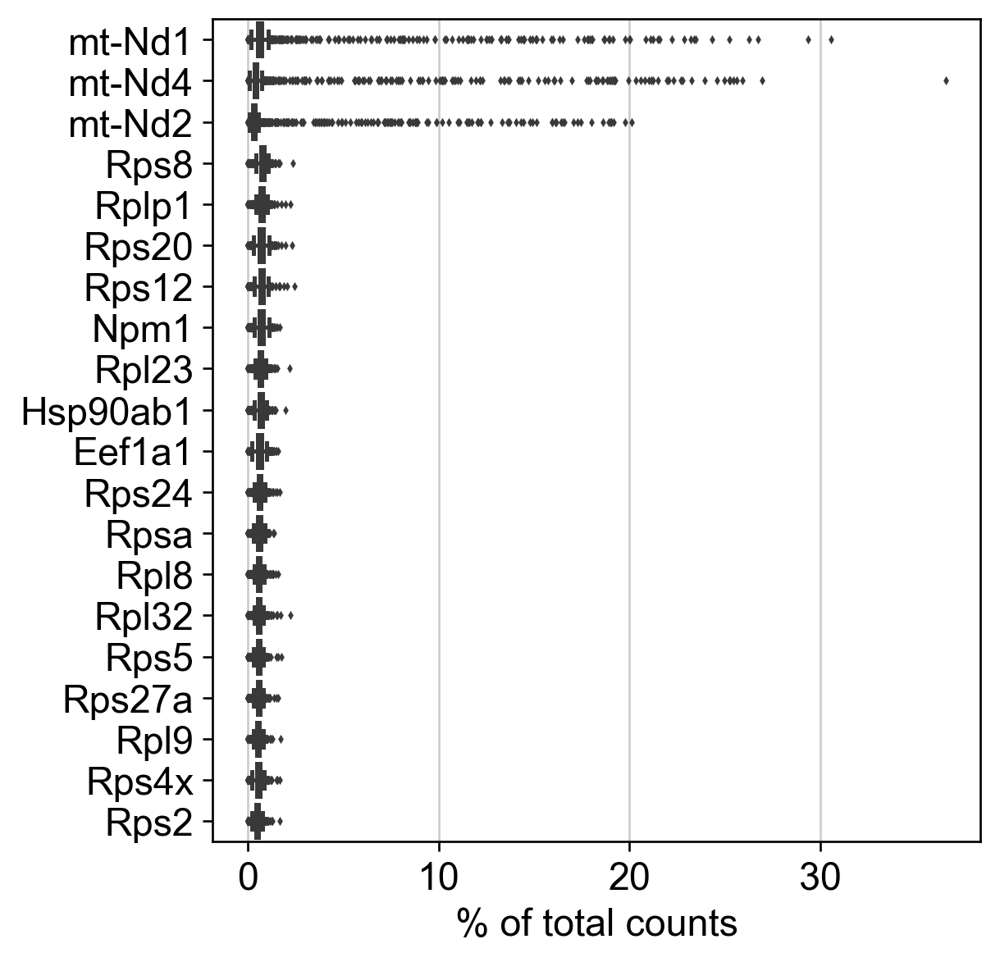

In [5]:
sc.pl.highest_expr_genes(adata, n_top=20,)

In [6]:
sc.pp.calculate_qc_metrics(adata, qc_vars=['ribo', 'mt'], percent_top=None, log1p=False, inplace=True)

Saving the raw data before I begin QC

In [7]:
adata.raw = adata

In [8]:
adata.obs

,n_genes_by_counts,total_counts,total_counts_ribo,pct_counts_ribo,total_counts_mt,pct_counts_mt
AAAGGATCATCAGCTA,6108,51696.0,11336.0,21.928196,1206.0,2.332869
AAAGTGAAGACAAGCC,6898,63107.0,14659.0,23.228802,976.0,1.546580
AACAAGACAATGTTGC,350,436.0,74.0,16.972477,10.0,2.293578
AACACACGTGTAACGG,224,600.0,61.0,10.166667,344.0,57.333332
AACCACATCCACAAGT,7396,70252.0,14954.0,21.286226,748.0,1.064738
...,...,...,...,...,...,...
TTTGATCGTAGAGGAA,4326,19656.0,5002.0,25.447699,320.0,1.628002
TTTGGAGCAGGTTCCG,5024,28978.0,5820.0,20.084202,484.0,1.670233
TTTGGTTTCCGAAATC,5529,32798.0,7230.0,22.044027,448.0,1.365937
TTTGTTGCATCGGCCA,5155,25648.0,5710.0,22.262945,321.0,1.251560


Examining the data so that I can make judgement calls on how I will filter it.

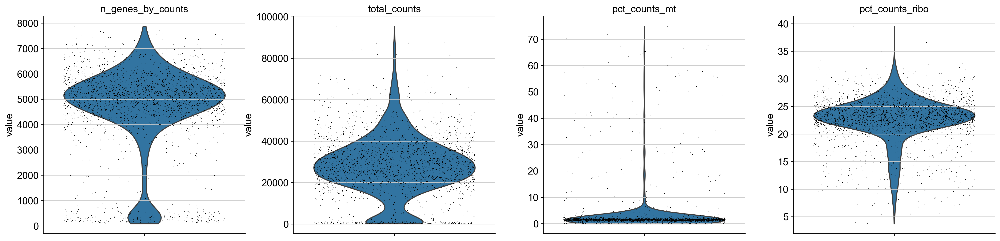

In [9]:
axs = sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo'],jitter=0.4, multi_panel=True)

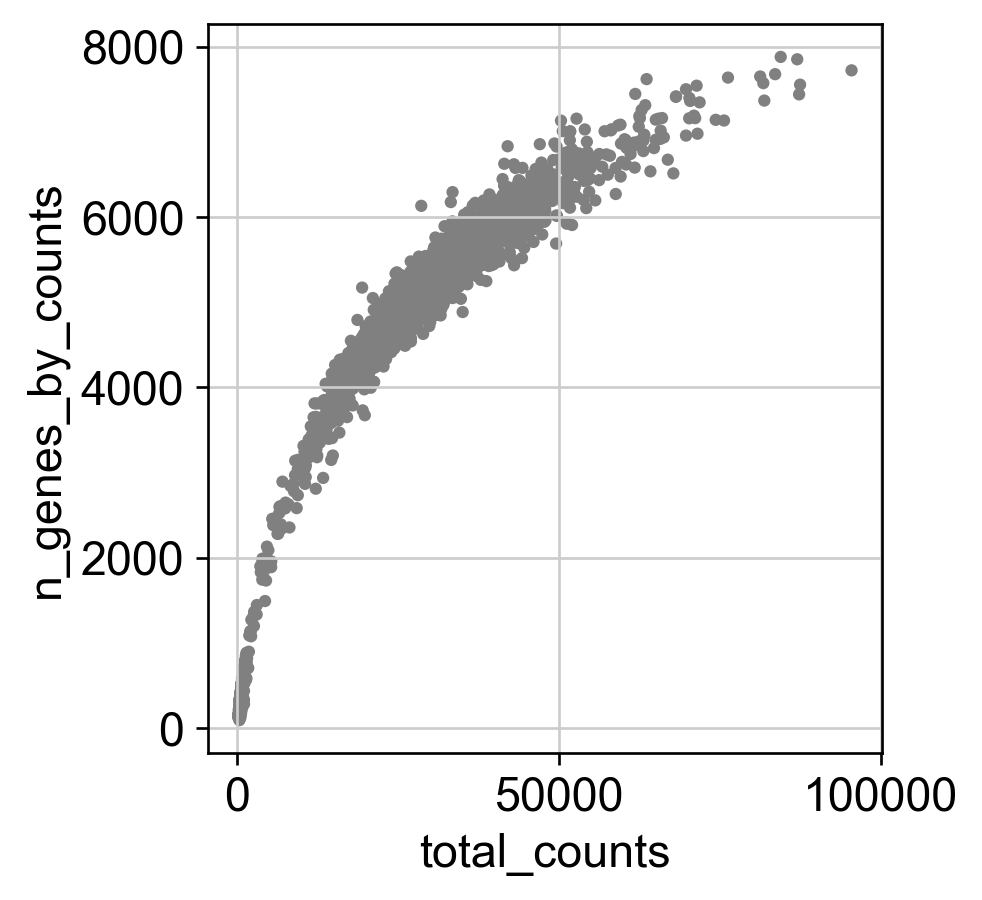

In [10]:
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

#### Removing doublets and bad genes

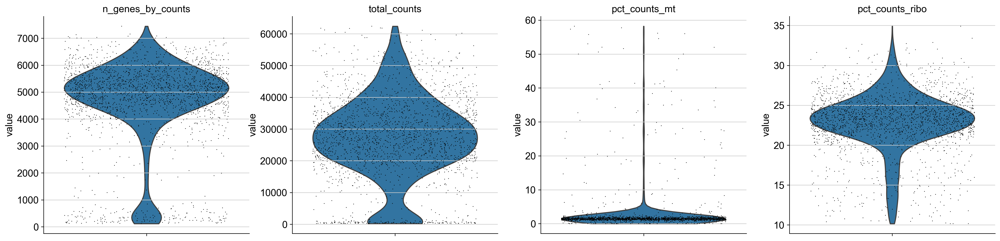

In [11]:
thresh = np.percentile(adata.obs['total_counts'],98)
adata = adata[adata.obs['total_counts'] < thresh, :]
adata = adata[adata.obs['pct_counts_mt'] < 60, :]
adata = adata[adata.obs['pct_counts_ribo'] < 35, :]
adata = adata[adata.obs['pct_counts_ribo'] > 10, :]
axs = sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo'],jitter=0.4, multi_panel=True)

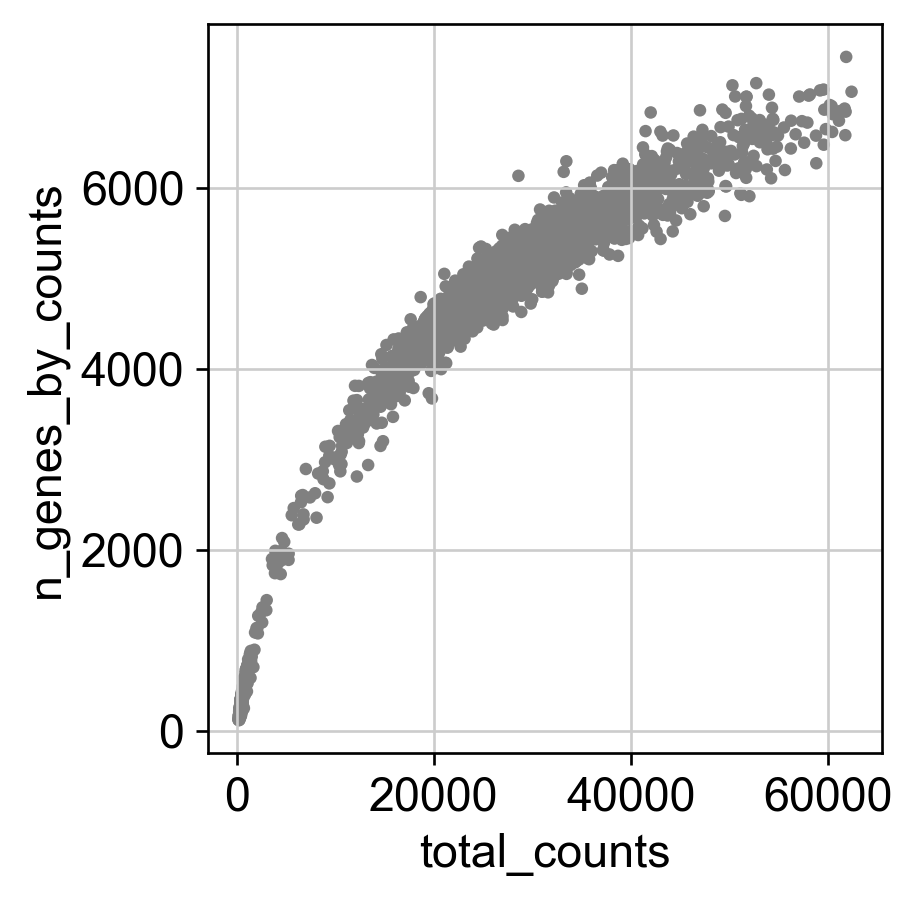

In [12]:
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')


In [13]:
adata.obs

,n_genes_by_counts,total_counts,total_counts_ribo,pct_counts_ribo,total_counts_mt,pct_counts_mt
AAAGGATCATCAGCTA,6108,51696.0,11336.0,21.928196,1206.0,2.332869
AACAAGACAATGTTGC,350,436.0,74.0,16.972477,10.0,2.293578
AACACACGTGTAACGG,224,600.0,61.0,10.166667,344.0,57.333332
AACCATGCAGTAGATA,303,378.0,67.0,17.724867,33.0,8.730159
AACCATGTCAAACGTC,6760,54390.0,12462.0,22.912300,704.0,1.294356
...,...,...,...,...,...,...
TTTGATCGTAGAGGAA,4326,19656.0,5002.0,25.447699,320.0,1.628002
TTTGGAGCAGGTTCCG,5024,28978.0,5820.0,20.084202,484.0,1.670233
TTTGGTTTCCGAAATC,5529,32798.0,7230.0,22.044027,448.0,1.365937
TTTGTTGCATCGGCCA,5155,25648.0,5710.0,22.262945,321.0,1.251560


Removing sporadically detected cells.

In [14]:
gThresh = 5
sc.pp.filter_genes(adata, min_cells=gThresh)

Trying to set attribute `.var` of view, copying.


In [15]:
adata.n_vars

16237

Removing malat, ribosomal, and mitochondrial genes as they are highly expressed but probably not informative as is done in lecture 7.

In [16]:
mito_genes = adata.var_names.str.startswith('mt-')
ribo_genes = adata.var_names.str.startswith(("Rpl","Rps"))
malat_gene = adata.var_names.str.startswith("Malat1")

remove = np.add(mito_genes, ribo_genes)
remove = np.add(remove, malat_gene)
keep = np.invert(remove)

adata = adata[:,keep].copy()

In [17]:
adata.n_vars

16124

Normalizing the count data.

#### Highly variable genes and PCA

In [18]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

Generate and populate highly variable gene info.

In [19]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=4, min_disp=0.25)
adata.var

,mt,ribo,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,n_cells,highly_variable,means,dispersions,dispersions_norm
Xkr4,False,False,59,0.028169,97.319400,62.0,56,False,0.013518,-0.443818,-0.500508
Sox17,False,False,70,0.131304,96.819627,289.0,68,True,0.074651,2.189324,1.816636
Mrpl15,False,False,1438,1.470241,34.666061,3236.0,1396,True,0.530267,1.441448,0.423170
Rgs20,False,False,32,0.014539,98.546115,32.0,30,False,0.006822,-0.584474,-0.624284
Npbwr1,False,False,7,0.003635,99.681963,8.0,7,False,0.002797,-0.068641,-0.170355
...,...,...,...,...,...,...,...,...,...,...,...
Usp9y,False,False,5,0.002272,99.772831,5.0,5,False,0.004938,1.985908,1.637631
Uba1y,False,False,17,0.009995,99.227624,22.0,16,False,0.005452,0.188256,0.055712
Eif2s3y,False,False,1186,2.082235,46.115402,4583.0,1142,False,0.661046,0.486280,-0.910035
Gm29650,False,False,15,0.006815,99.318492,15.0,14,False,0.002986,-0.702684,-0.728308


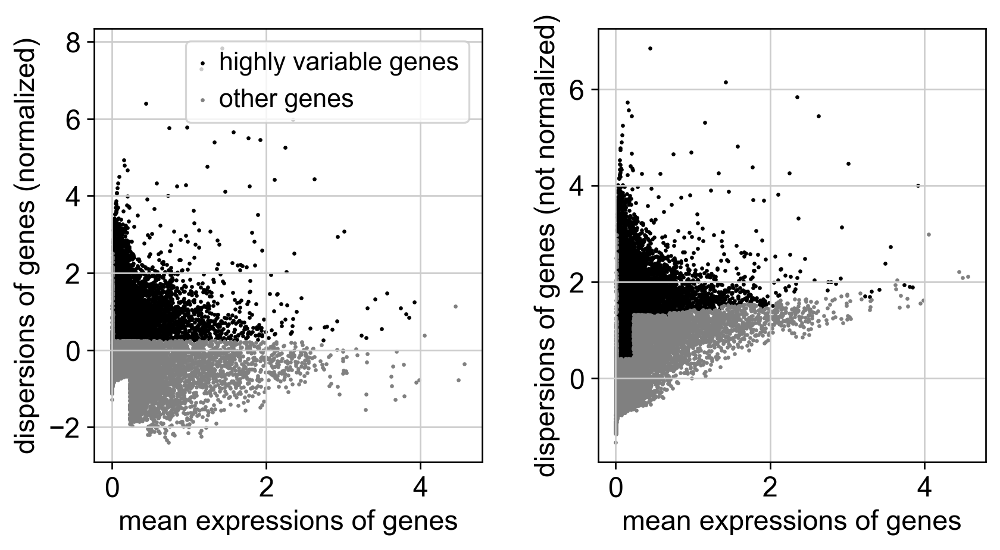

In [20]:
sc.pl.highly_variable_genes(adata)


Scaling the data with z-scores for PCA.

In [21]:
sc.pp.scale(adata, max_value=10)

PCA analysis

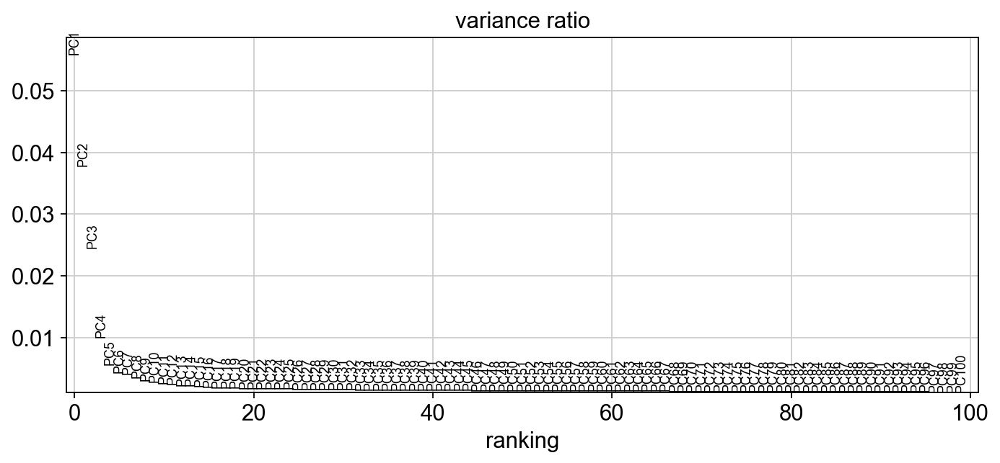

In [22]:
sc.tl.pca(adata, n_comps=100)
sc.set_figure_params(figsize="10, 4")
sc.pl.pca_variance_ratio(adata,100, )

<AxesSubplot:title={'center':'Zfp42'}, xlabel='PC1', ylabel='PC4'>

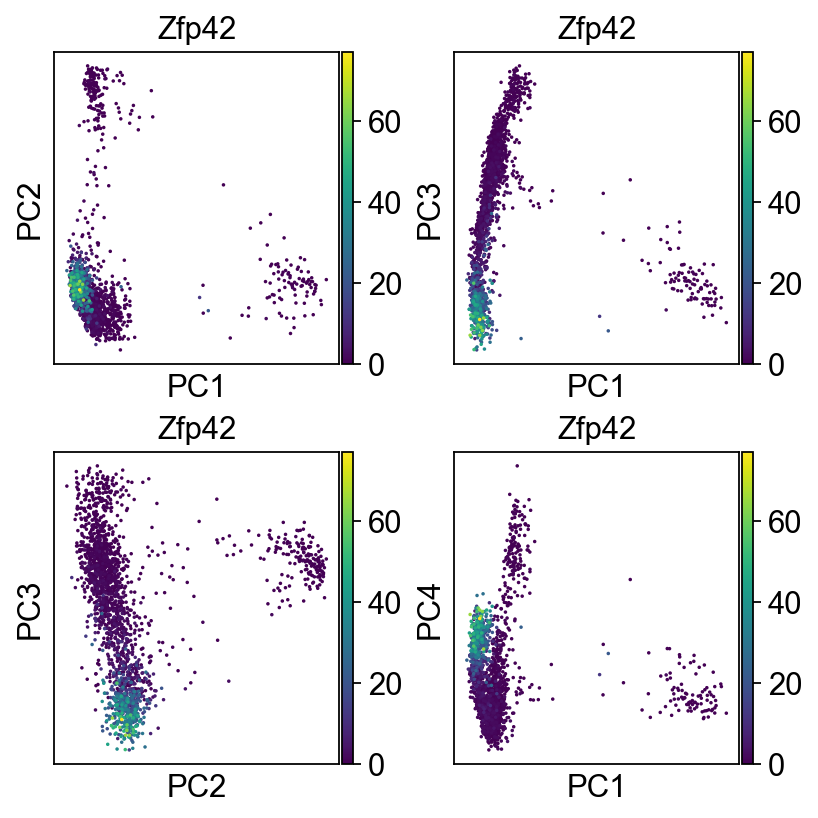

In [23]:
fig, axs = plt.subplots(2,2, figsize=(5,5), constrained_layout=True)
sc.pl.pca_scatter(adata, color="Zfp42", ax=axs[0,0], show=False, size=10)
sc.pl.pca_scatter(adata, color="Zfp42", components="1,3", ax=axs[0,1], show=False, size=10)
sc.pl.pca_scatter(adata, color="Zfp42", components="2,3", ax=axs[1,0], show=False, size=10)
sc.pl.pca_scatter(adata, color="Zfp42", components="1,4", ax=axs[1,1], show=False, size=10)

#### Identify and remove MEF

*This section is from the score_genes_tutorial*

Read in the genes_fibroblast file.

In [24]:
MEF = [x.strip() for x in open("genes_fibroblast.csv")]
MEF = [x for x in MEF if x in adata.var_names]
MEF

['Thy1', 'Lgals1', 'Postn', 'Aspn']

Score genes according to the MEF genes in the fibroblast file.

In [25]:
sc.tl.score_genes(adata, gene_list = MEF, score_name = "MEF_genesets")

In [26]:
adata.obs

,n_genes_by_counts,total_counts,total_counts_ribo,pct_counts_ribo,total_counts_mt,pct_counts_mt,MEF_genesets
AAAGGATCATCAGCTA,6108,51696.0,11336.0,21.928196,1206.0,2.332869,-5.465
AACAAGACAATGTTGC,350,436.0,74.0,16.972477,10.0,2.293578,-0.055
AACACACGTGTAACGG,224,600.0,61.0,10.166667,344.0,57.333332,-0.030
AACCATGCAGTAGATA,303,378.0,67.0,17.724867,33.0,8.730159,-0.060
AACCATGTCAAACGTC,6760,54390.0,12462.0,22.912300,704.0,1.294356,-6.510
...,...,...,...,...,...,...,...
TTTGATCGTAGAGGAA,4326,19656.0,5002.0,25.447699,320.0,1.628002,-1.735
TTTGGAGCAGGTTCCG,5024,28978.0,5820.0,20.084202,484.0,1.670233,-3.875
TTTGGTTTCCGAAATC,5529,32798.0,7230.0,22.044027,448.0,1.365937,-3.705
TTTGTTGCATCGGCCA,5155,25648.0,5710.0,22.262945,321.0,1.251560,-2.460


It seems like the positive scores are likely the MEFs, but I want to investigate more before removing anything.

<AxesSubplot:title={'center':'MEF_genesets'}, xlabel='PC1', ylabel='PC4'>

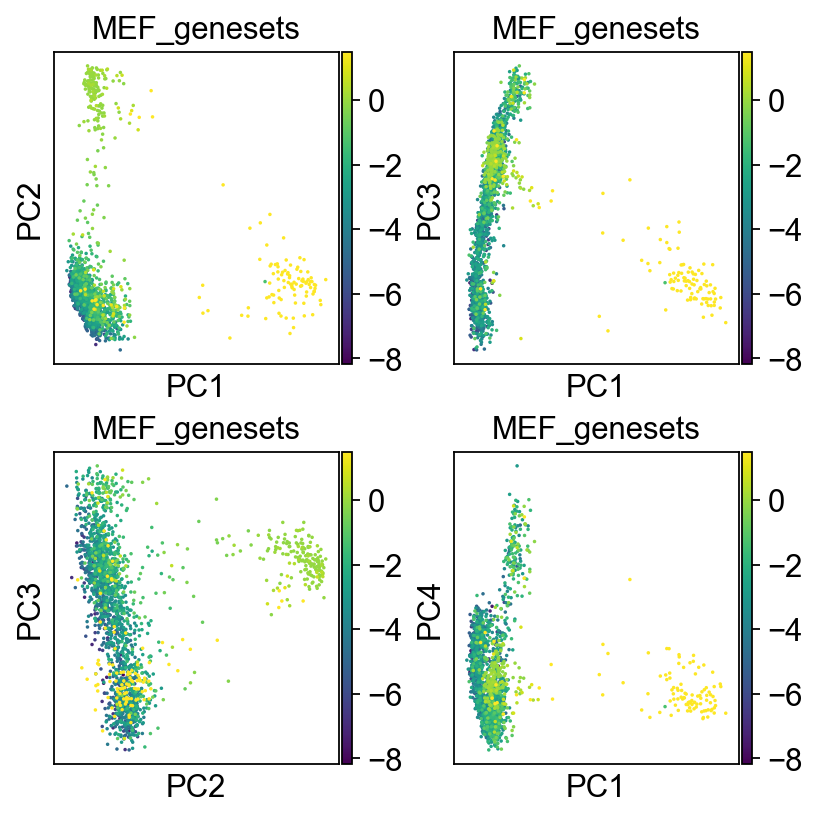

In [27]:
fig, axs = plt.subplots(2,2, figsize=(5,5), constrained_layout=True)
sc.pl.pca_scatter(adata, ax=axs[0,0], color = "MEF_genesets", show=False, size=10, vmax = 1.5)
sc.pl.pca_scatter(adata, components="1,3", ax=axs[0,1], color = "MEF_genesets", show=False, size=10, vmax = 1.5)
sc.pl.pca_scatter(adata, components="2,3", ax=axs[1,0], color = "MEF_genesets", show=False, size=10, vmax = 1.5)
sc.pl.pca_scatter(adata, components="1,4", ax=axs[1,1], color = "MEF_genesets", show=False, size=10, vmax = 1.5)

There is an obvious cluster that has very high scores for the MEF genes, this is what I will eventually remove.

Using nearest neighbor and leiden to identify the MEF cluster.

In [28]:
n_pcs = 50
n_neighbors = 25
sc.pp.neighbors(adata, n_neighbors=n_neighbors, n_pcs=n_pcs)

In [29]:
sc.tl.leiden(adata, .05)

In [30]:
adata.obs

,n_genes_by_counts,total_counts,total_counts_ribo,pct_counts_ribo,total_counts_mt,pct_counts_mt,MEF_genesets,leiden
AAAGGATCATCAGCTA,6108,51696.0,11336.0,21.928196,1206.0,2.332869,-5.465,0
AACAAGACAATGTTGC,350,436.0,74.0,16.972477,10.0,2.293578,-0.055,1
AACACACGTGTAACGG,224,600.0,61.0,10.166667,344.0,57.333332,-0.030,1
AACCATGCAGTAGATA,303,378.0,67.0,17.724867,33.0,8.730159,-0.060,1
AACCATGTCAAACGTC,6760,54390.0,12462.0,22.912300,704.0,1.294356,-6.510,0
...,...,...,...,...,...,...,...,...
TTTGATCGTAGAGGAA,4326,19656.0,5002.0,25.447699,320.0,1.628002,-1.735,0
TTTGGAGCAGGTTCCG,5024,28978.0,5820.0,20.084202,484.0,1.670233,-3.875,0
TTTGGTTTCCGAAATC,5529,32798.0,7230.0,22.044027,448.0,1.365937,-3.705,0
TTTGTTGCATCGGCCA,5155,25648.0,5710.0,22.262945,321.0,1.251560,-2.460,0


<AxesSubplot:title={'center':'leiden'}, xlabel='PC1', ylabel='PC4'>

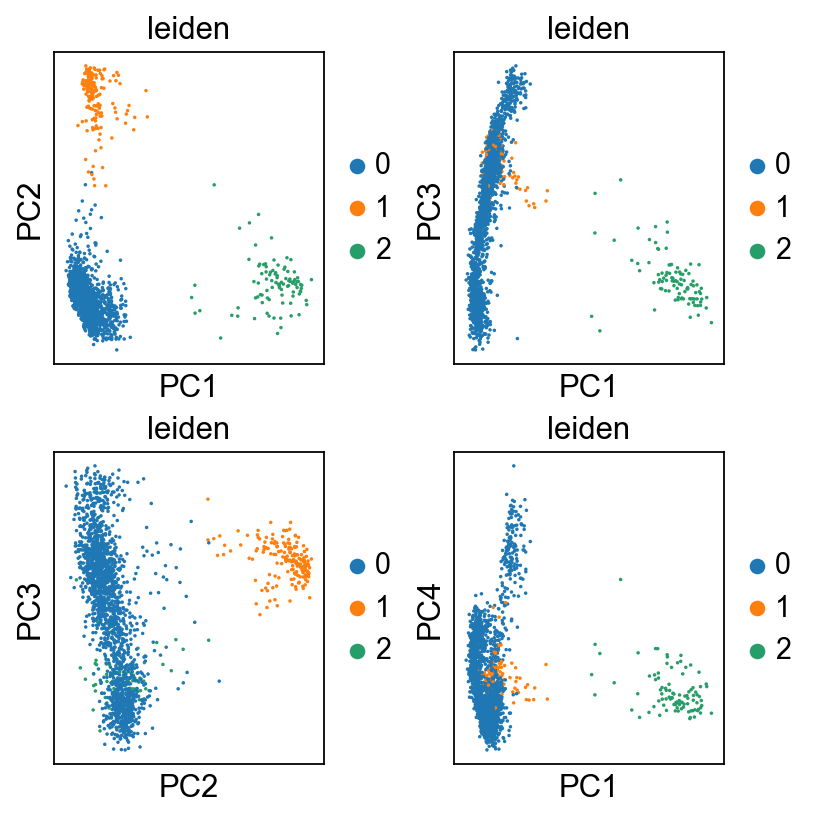

In [31]:
fig, axs = plt.subplots(2,2, figsize=(5,5), constrained_layout=True)
sc.pl.pca_scatter(adata, ax=axs[0,0], color = "leiden", show=False, size=10, vmax = 1.5)
sc.pl.pca_scatter(adata, components="1,3", ax=axs[0,1], color = "leiden", show=False, size=10, vmax = 1.5)
sc.pl.pca_scatter(adata, components="2,3", ax=axs[1,0], color = "leiden", show=False, size=10, vmax = 1.5)
sc.pl.pca_scatter(adata, components="1,4", ax=axs[1,1], color = "leiden", show=False, size=10, vmax = 1.5)

Based on the gene scoring graph above, cluster 2 is what I will remove. 

Labeling cluster 2 as MEFs, and all other clusters as other.

In [32]:
adata.obs['cell_type_label'] = None 
adata.obs.loc[adata.obs['leiden'] == '2', 'cell_type_label'] = 'MEF'
adata.obs.loc[adata.obs['leiden'] != '2', 'cell_type_label'] = 'Other'

In [33]:
adata.obs

,n_genes_by_counts,total_counts,total_counts_ribo,pct_counts_ribo,total_counts_mt,pct_counts_mt,MEF_genesets,leiden,cell_type_label
AAAGGATCATCAGCTA,6108,51696.0,11336.0,21.928196,1206.0,2.332869,-5.465,0,Other
AACAAGACAATGTTGC,350,436.0,74.0,16.972477,10.0,2.293578,-0.055,1,Other
AACACACGTGTAACGG,224,600.0,61.0,10.166667,344.0,57.333332,-0.030,1,Other
AACCATGCAGTAGATA,303,378.0,67.0,17.724867,33.0,8.730159,-0.060,1,Other
AACCATGTCAAACGTC,6760,54390.0,12462.0,22.912300,704.0,1.294356,-6.510,0,Other
...,...,...,...,...,...,...,...,...,...
TTTGATCGTAGAGGAA,4326,19656.0,5002.0,25.447699,320.0,1.628002,-1.735,0,Other
TTTGGAGCAGGTTCCG,5024,28978.0,5820.0,20.084202,484.0,1.670233,-3.875,0,Other
TTTGGTTTCCGAAATC,5529,32798.0,7230.0,22.044027,448.0,1.365937,-3.705,0,Other
TTTGTTGCATCGGCCA,5155,25648.0,5710.0,22.262945,321.0,1.251560,-2.460,0,Other


Removing MEF clustered cells.

In [34]:
refined_adata = adata[adata.obs['cell_type_label'] != "MEF", :]

Trying to set attribute `.obs` of view, copying.
... storing 'cell_type_label' as categorical


<AxesSubplot:title={'center':'MEF_genesets'}, xlabel='PC1', ylabel='PC4'>

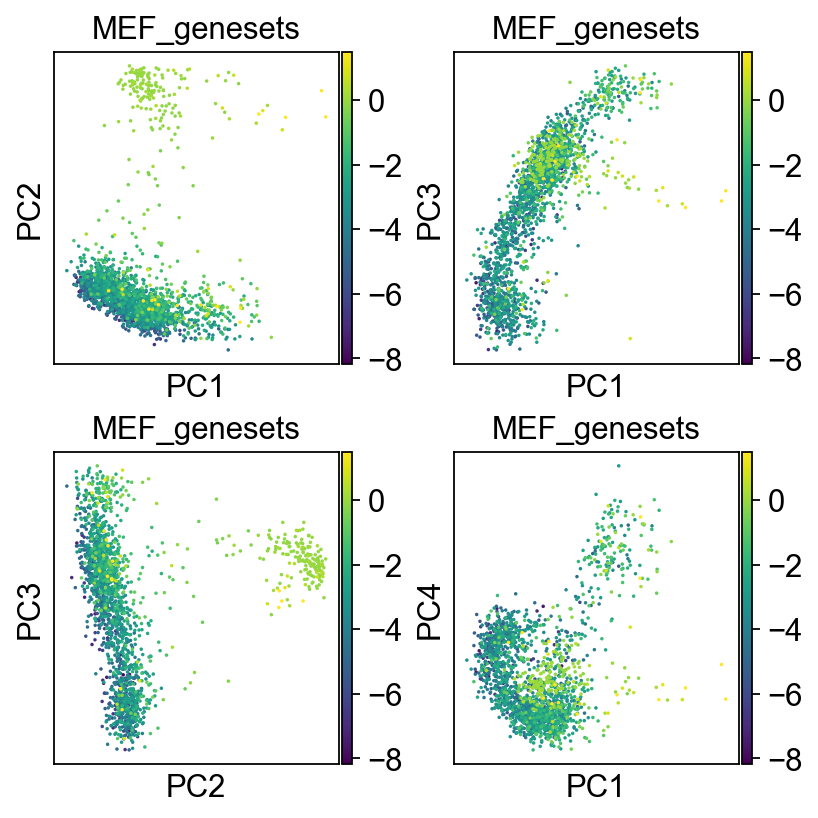

In [35]:
fig, axs = plt.subplots(2,2, figsize=(5,5), constrained_layout=True)
sc.pl.pca_scatter(refined_adata, ax=axs[0,0], color = "MEF_genesets", show=False, size=10, vmax = 1.5)
sc.pl.pca_scatter(refined_adata, components="1,3", ax=axs[0,1], color = "MEF_genesets", show=False, size=10, vmax = 1.5)
sc.pl.pca_scatter(refined_adata, components="2,3", ax=axs[1,0], color = "MEF_genesets", show=False, size=10, vmax = 1.5)
sc.pl.pca_scatter(refined_adata, components="1,4", ax=axs[1,1], color = "MEF_genesets", show=False, size=10, vmax = 1.5)

In [36]:
raw_adata = adata.raw.to_adata()
unprocessed_MEFless = raw_adata[raw_adata.obs['cell_type_label'] != "MEF", :]
unprocessed_MEFless.obs

,n_genes_by_counts,total_counts,total_counts_ribo,pct_counts_ribo,total_counts_mt,pct_counts_mt,MEF_genesets,leiden,cell_type_label
AAAGGATCATCAGCTA,6108,51696.0,11336.0,21.928196,1206.0,2.332869,-5.465,0,Other
AACAAGACAATGTTGC,350,436.0,74.0,16.972477,10.0,2.293578,-0.055,1,Other
AACACACGTGTAACGG,224,600.0,61.0,10.166667,344.0,57.333332,-0.030,1,Other
AACCATGCAGTAGATA,303,378.0,67.0,17.724867,33.0,8.730159,-0.060,1,Other
AACCATGTCAAACGTC,6760,54390.0,12462.0,22.912300,704.0,1.294356,-6.510,0,Other
...,...,...,...,...,...,...,...,...,...
TTTGATCGTAGAGGAA,4326,19656.0,5002.0,25.447699,320.0,1.628002,-1.735,0,Other
TTTGGAGCAGGTTCCG,5024,28978.0,5820.0,20.084202,484.0,1.670233,-3.875,0,Other
TTTGGTTTCCGAAATC,5529,32798.0,7230.0,22.044027,448.0,1.365937,-3.705,0,Other
TTTGTTGCATCGGCCA,5155,25648.0,5710.0,22.262945,321.0,1.251560,-2.460,0,Other


In [37]:
unprocessed_MEFless.write_h5ad("adHW2_MEFless.h5ad")

Trying to set attribute `.obs` of view, copying.
... storing 'cell_type_label' as categorical


### Your mission: Part 2

Clean the data as we discussed in class, including, but not limited to, filtering out potential doublets and low quality barcodes, and excluding undetected genes.

I will repeat much of the steps above with the unprocessed_MEFless data.

In [38]:
unprocessed_MEFless[unprocessed_MEFless.obs['cell_type_label']=='MEF'].obs

,n_genes_by_counts,total_counts,total_counts_ribo,pct_counts_ribo,total_counts_mt,pct_counts_mt,MEF_genesets,leiden,cell_type_label


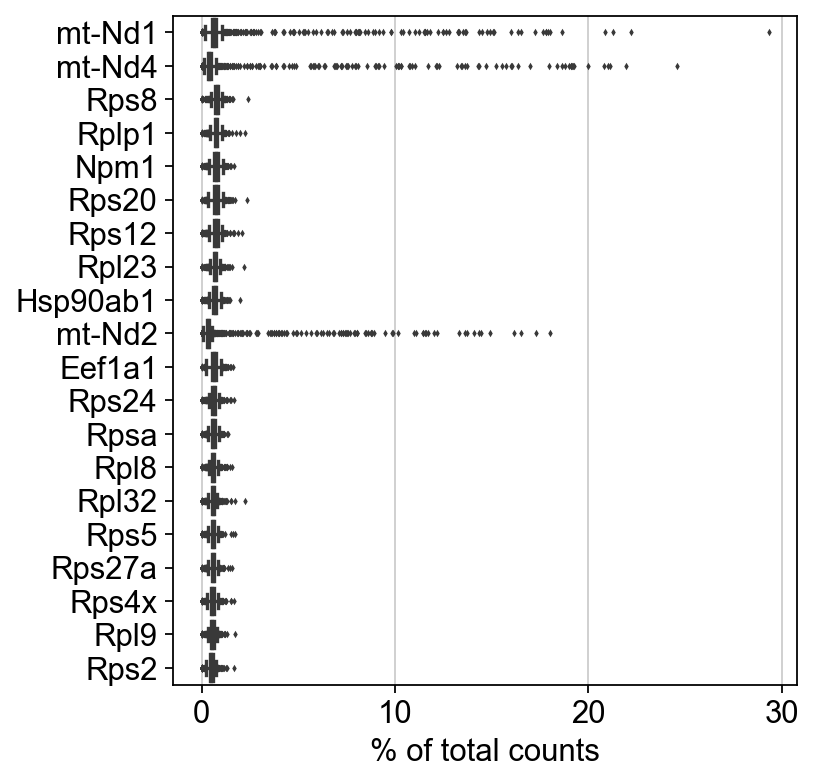

In [39]:
sc.pl.highest_expr_genes(unprocessed_MEFless, n_top=20,)

#### Investigating ribosomal and mitochondrial percentages

In [40]:
sc.pp.calculate_qc_metrics(unprocessed_MEFless, qc_vars=['ribo', 'mt'], percent_top=None, log1p=False, inplace=True)

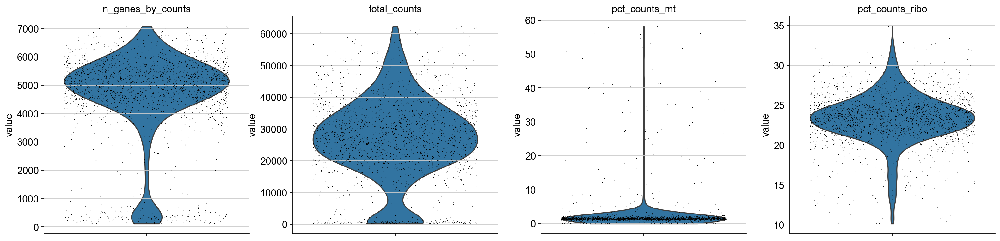

In [41]:
axs = sc.pl.violin(unprocessed_MEFless, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo'],jitter=0.4, multi_panel=True)

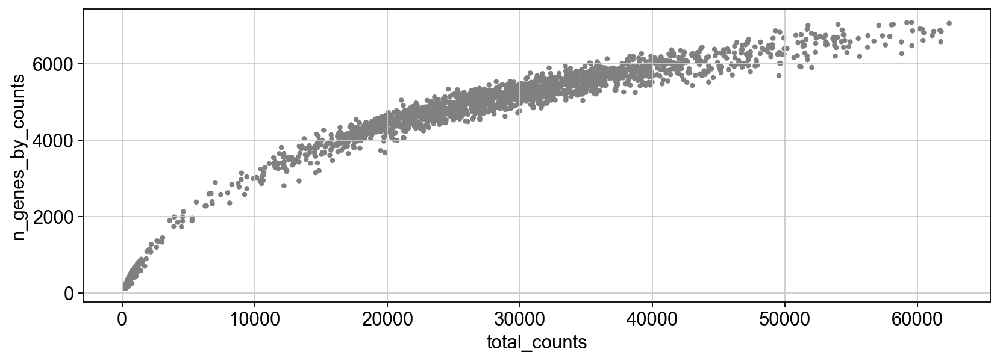

In [42]:
sc.pl.scatter(unprocessed_MEFless, x='total_counts', y='n_genes_by_counts')

#### Filtering for ribosomal and mitochondrial pecentages, as well as removing doublets

Excluding doublets by removing the observations with the top 2% total_counts. There are about 2000 recovered cells, so in looking at the multiplet table, there is a ~1.6% doublet rate. I rounded up to 2% for this processing.

To remove low-qaulity cells, I chose the thresholds explained below. These cells are low-quality because they fall outside of general trends in the data, which indicates that they are more likely to be outliers.

For pct_counts_ribo, I chose a limit of 60 because it seemed like there was a pretty even spread that got pretty sparse after 60. Then for pct_counts_mt I chose an upper limit of 35 because there was only a few examples that exceeded it, and a lower limit of 10. The lecture didn't do a lower limit but it mentioned one, and there were very few examples below 10%, so I've decided to exclude them.

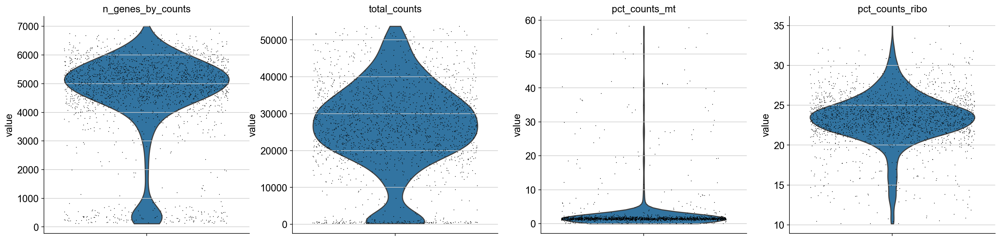

In [43]:
thresh = np.percentile(unprocessed_MEFless.obs['total_counts'],98)
unprocessed_MEFless = unprocessed_MEFless[unprocessed_MEFless.obs['total_counts'] < thresh, :]
unprocessed_MEFless = unprocessed_MEFless[unprocessed_MEFless.obs['pct_counts_mt'] < 60, :]
unprocessed_MEFless = unprocessed_MEFless[unprocessed_MEFless.obs['pct_counts_ribo'] < 35, :]
unprocessed_MEFless = unprocessed_MEFless[unprocessed_MEFless.obs['pct_counts_ribo'] > 10, :]
axs = sc.pl.violin(unprocessed_MEFless, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo'],jitter=0.4, multi_panel=True)

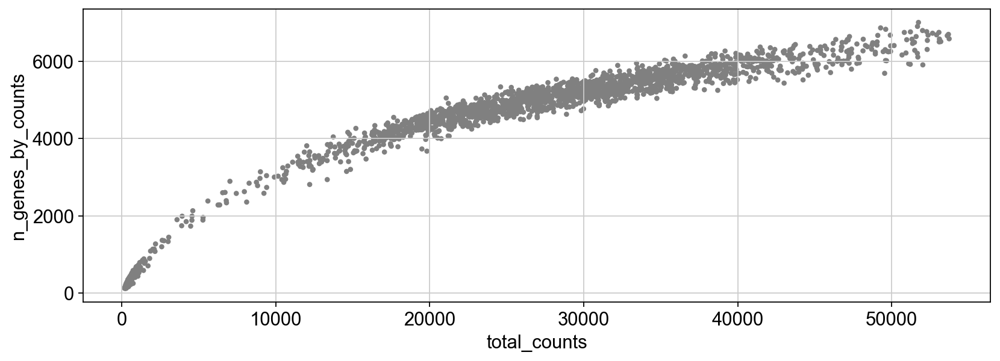

In [44]:
sc.pl.scatter(unprocessed_MEFless, x='total_counts', y='n_genes_by_counts')

#### Removing sporadically detected cells

Remove all genes with less than 5 cells.

In [45]:
gThresh = 5
sc.pp.filter_genes(unprocessed_MEFless, min_cells=gThresh)

Trying to set attribute `.var` of view, copying.


#### Removing uninformative cells

Malat, ribosomal, and mitochondrial genes are highly expressed but probably not informative. They can be removed.

In [46]:
mito_genes = unprocessed_MEFless.var_names.str.startswith('mt-')
ribo_genes = unprocessed_MEFless.var_names.str.startswith(("Rpl","Rps"))
malat_gene = unprocessed_MEFless.var_names.str.startswith("Malat1")

remove = np.add(mito_genes, ribo_genes)
remove = np.add(remove, malat_gene)
keep = np.invert(remove)

unprocessed_MEFless = unprocessed_MEFless[:,keep].copy()

#### Normalize data

In [47]:
sc.pp.normalize_total(unprocessed_MEFless, target_sum=1e4)
sc.pp.log1p(unprocessed_MEFless)

### Your mission: Part 3

Predict the stage of differentiation for each cell.

In [48]:
###  Part 3 code, figures and explanatory text goes here and in subsequent cells. Show all code.

#### Highly variable genes and scaling

In [49]:
sc.pp.highly_variable_genes(unprocessed_MEFless, min_mean=0.0125, max_mean=4, min_disp=0.25)
unprocessed_MEFless.var

,mt,ribo,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,n_cells,highly_variable,means,dispersions,dispersions_norm
Xkr4,False,False,56,0.029150,97.233202,59.0,52,False,0.013979,-0.422861,-0.498732
Sox17,False,False,66,0.135375,96.739130,274.0,65,True,0.079170,2.193995,1.705781
Mrpl15,False,False,1364,1.504941,32.608696,3046.0,1325,True,0.544003,1.466969,0.413696
Rgs20,False,False,28,0.013834,98.616601,28.0,27,False,0.006788,-0.558405,-0.612918
Npbwr1,False,False,7,0.003953,99.654150,8.0,7,False,0.002988,-0.068769,-0.200435
...,...,...,...,...,...,...,...,...,...,...,...
Usp9y,False,False,5,0.002470,99.752964,5.0,5,False,0.005388,2.015222,1.555178
Uba1y,False,False,16,0.010375,99.209486,21.0,16,False,0.005825,0.187977,0.015855
Eif2s3y,False,False,1099,2.074111,45.701581,4198.0,1071,False,0.669811,0.497825,-0.904175
Gm29650,False,False,14,0.006917,99.308300,14.0,14,False,0.003191,-0.703012,-0.734739


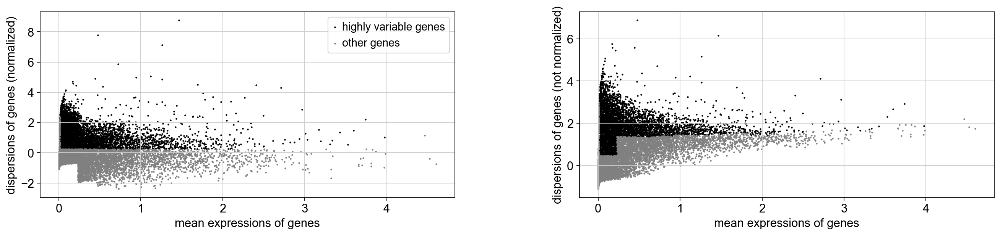

In [50]:
sc.pl.highly_variable_genes(unprocessed_MEFless)

In [51]:
sc.pp.scale(unprocessed_MEFless, max_value=10)

#### PCA

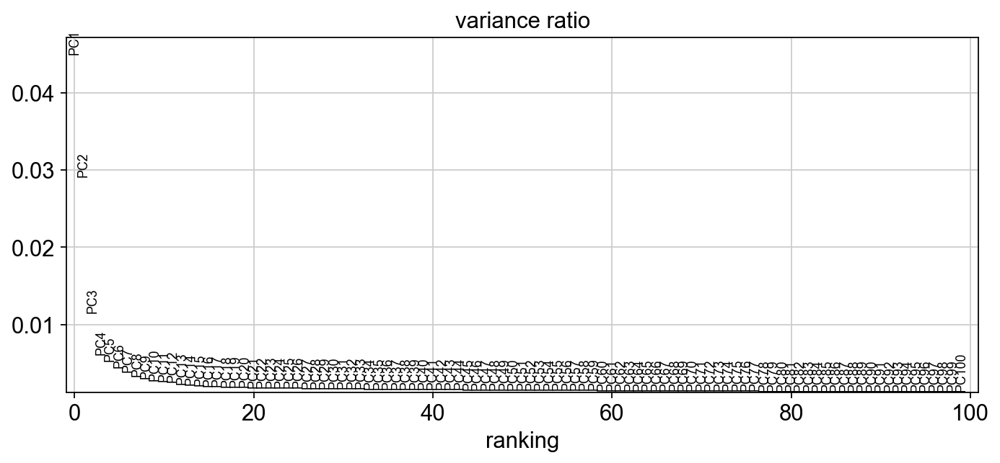

In [52]:
sc.tl.pca(unprocessed_MEFless, n_comps=100)
sc.set_figure_params(figsize="10, 4")
sc.pl.pca_variance_ratio(unprocessed_MEFless,100, )

<AxesSubplot:title={'center':'Zfp42'}, xlabel='PC1', ylabel='PC4'>

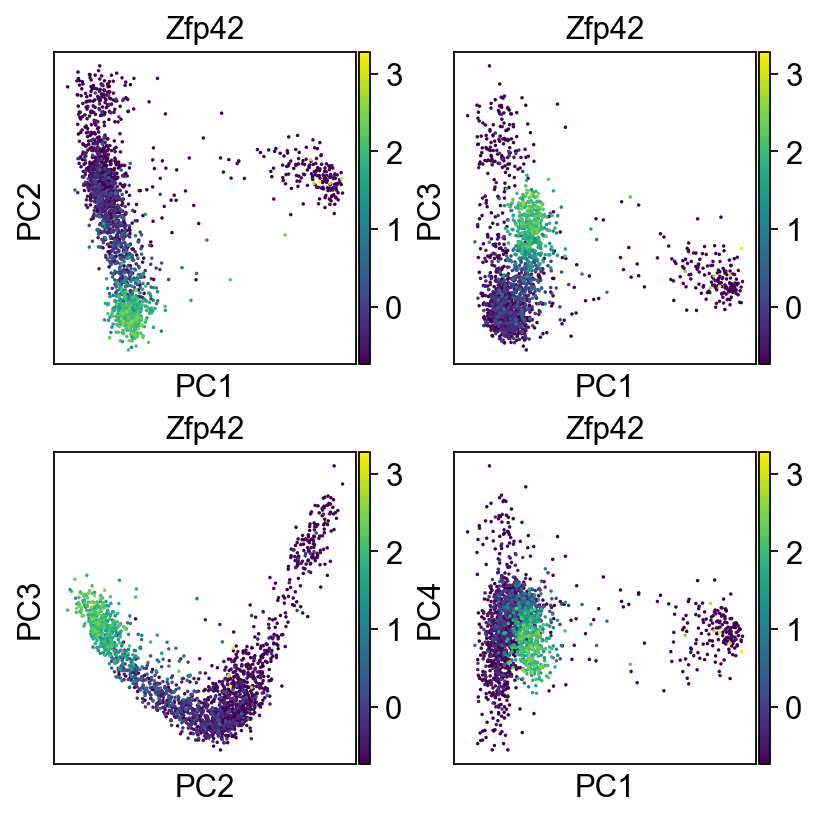

In [53]:
fig, axs = plt.subplots(2,2, figsize=(5,5), constrained_layout=True)
sc.pl.pca_scatter(unprocessed_MEFless, color="Zfp42", ax=axs[0,0], show=False, size=10)
sc.pl.pca_scatter(unprocessed_MEFless, color="Zfp42", components="1,3", ax=axs[0,1], show=False, size=10)
sc.pl.pca_scatter(unprocessed_MEFless, color="Zfp42", components="2,3", ax=axs[1,0], show=False, size=10)
sc.pl.pca_scatter(unprocessed_MEFless, color="Zfp42", components="1,4", ax=axs[1,1], show=False, size=10)

Based on the PCA data, we can see that there seems to be a trajectory from the bottom to the top of the PC1, PC2 graph, and from left to right of the PC2, PC3 graph. This shows that differentiation probably follows those directions. Additionally, there does not seem to be a spot where it bifurcates, meaning probably all cells follow the same path.

In [54]:
n_pcs = 15
n_neighbors = 25
sc.pp.neighbors(unprocessed_MEFless, n_neighbors=n_neighbors, n_pcs=n_pcs)
sc.tl.leiden(unprocessed_MEFless, .3)

<AxesSubplot:title={'center':'leiden'}, xlabel='PC1', ylabel='PC4'>

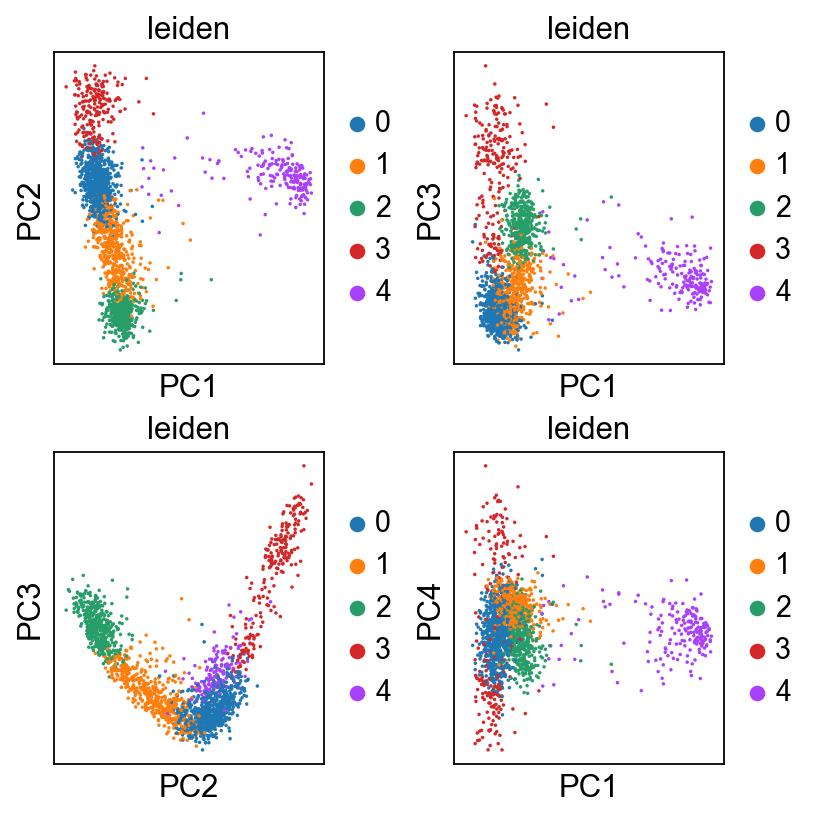

In [55]:
fig, axs = plt.subplots(2,2, figsize=(5,5), constrained_layout=True)
sc.pl.pca_scatter(unprocessed_MEFless, ax=axs[0,0], color = "leiden", show=False, size=10, vmax = 1.5)
sc.pl.pca_scatter(unprocessed_MEFless, components="1,3", ax=axs[0,1], color = "leiden", show=False, size=10, vmax = 1.5)
sc.pl.pca_scatter(unprocessed_MEFless, components="2,3", ax=axs[1,0], color = "leiden", show=False, size=10, vmax = 1.5)
sc.pl.pca_scatter(unprocessed_MEFless, components="1,4", ax=axs[1,1], color = "leiden", show=False, size=10, vmax = 1.5)

#### Gene scoring - identifying clusters with specific genes

##### Naive Pluripotent

Based on the concentration of naive genes, cluster 2 in the leiden clusters is probably the naive pluripotent cells. The size and location of high concentrations of naive genes correlates to this cluster.

<AxesSubplot:title={'center':'naive_genesets'}, xlabel='PC1', ylabel='PC4'>

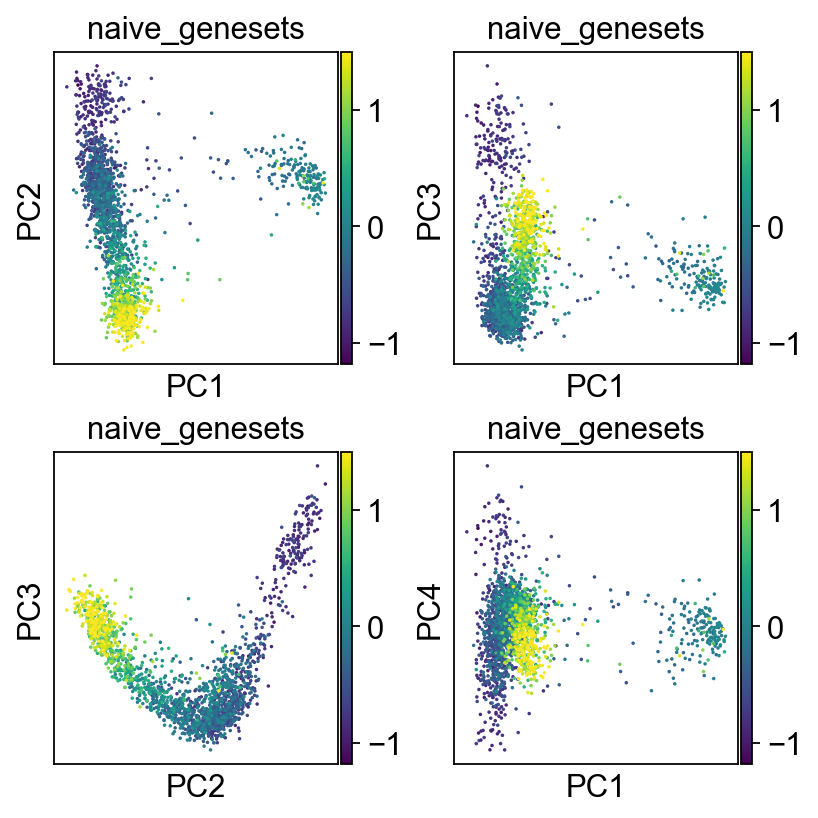

In [56]:
naive = [x.strip() for x in open("genes_naive.csv")]
naive = [x for x in naive if x in unprocessed_MEFless.var_names]

sc.tl.score_genes(unprocessed_MEFless, gene_list = naive, score_name = "naive_genesets")

fig, axs = plt.subplots(2,2, figsize=(5,5), constrained_layout=True)
sc.pl.pca_scatter(unprocessed_MEFless, ax=axs[0,0], color = "naive_genesets", show=False, size=10, vmax = 1.5)
sc.pl.pca_scatter(unprocessed_MEFless, components="1,3", ax=axs[0,1], color = "naive_genesets", show=False, size=10, vmax = 1.5)
sc.pl.pca_scatter(unprocessed_MEFless, components="2,3", ax=axs[1,0], color = "naive_genesets", show=False, size=10, vmax = 1.5)
sc.pl.pca_scatter(unprocessed_MEFless, components="1,4", ax=axs[1,1], color = "naive_genesets", show=False, size=10, vmax = 1.5)

##### Primed Pluripotent

Based on the concentration of primed pluripotent genes, cluster 1 in the leiden clusters is probably the primed pluripotent cells. The size and location of high concentrations of primed pluripotent genes correlates to this cluster. There is not as obvious of a separation of these cells, but there does seem to be more yellow in the location corresponding to cluster 1.

<AxesSubplot:title={'center':'primed_genesets'}, xlabel='PC1', ylabel='PC4'>

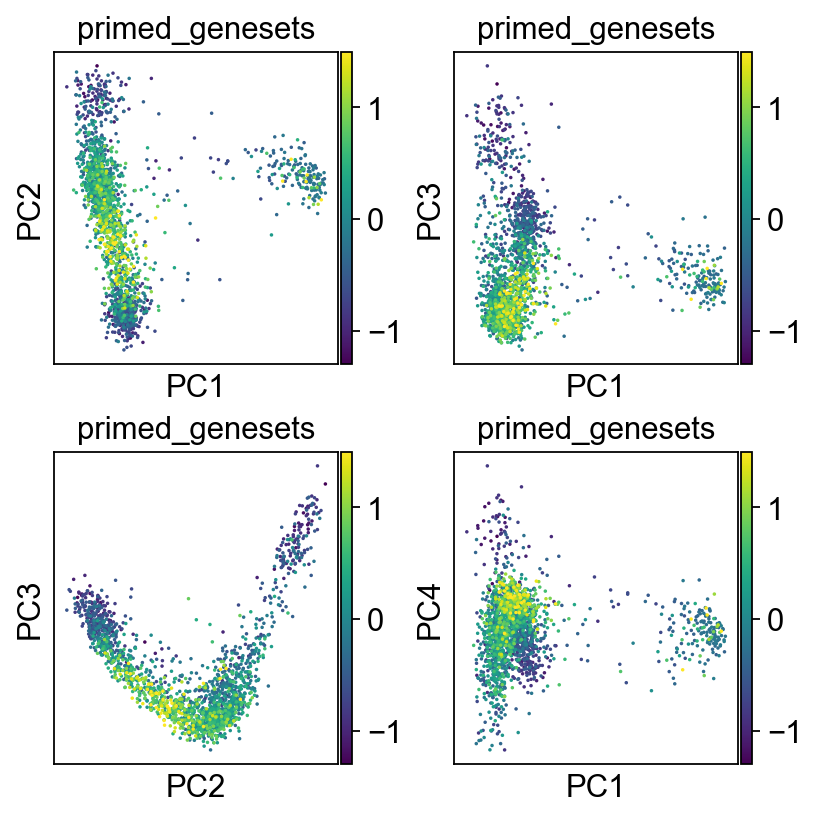

In [57]:
primed = [x.strip() for x in open("genes_primed.csv")]
primed = [x for x in primed if x in unprocessed_MEFless.var_names]

sc.tl.score_genes(unprocessed_MEFless, gene_list = primed, score_name = "primed_genesets")

fig, axs = plt.subplots(2,2, figsize=(5,5), constrained_layout=True)
sc.pl.pca_scatter(unprocessed_MEFless, ax=axs[0,0], color = "primed_genesets", show=False, size=10, vmax = 1.5)
sc.pl.pca_scatter(unprocessed_MEFless, components="1,3", ax=axs[0,1], color = "primed_genesets", show=False, size=10, vmax = 1.5)
sc.pl.pca_scatter(unprocessed_MEFless, components="2,3", ax=axs[1,0], color = "primed_genesets", show=False, size=10, vmax = 1.5)
sc.pl.pca_scatter(unprocessed_MEFless, components="1,4", ax=axs[1,1], color = "primed_genesets", show=False, size=10, vmax = 1.5)

##### Primitive Streak

Based on the concentration of primitive streak genes, cluster 0 in the leiden clusters is probably the naive primitive streak cells. The size and location of high concentrations of primitive streak genes correlates to this cluster.

<AxesSubplot:title={'center':'primitive_streak_genesets'}, xlabel='PC1', ylabel='PC4'>

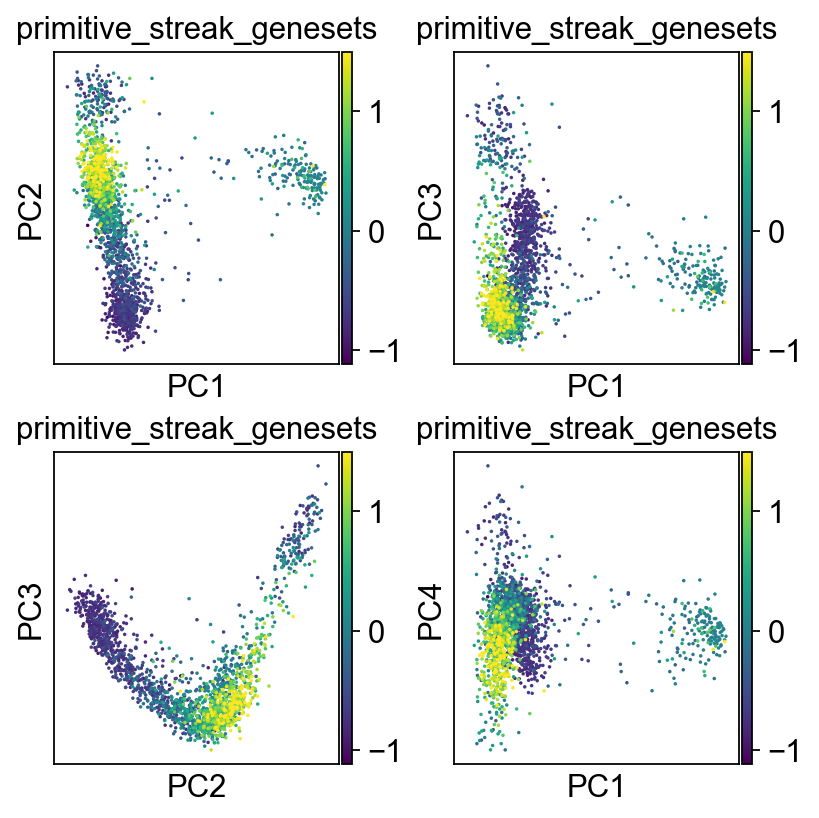

In [58]:
prim = [x.strip() for x in open("genes_primitive_streak.csv")]
prim = [x for x in prim if x in unprocessed_MEFless.var_names]

sc.tl.score_genes(unprocessed_MEFless, gene_list = prim, score_name = "primitive_streak_genesets")

fig, axs = plt.subplots(2,2, figsize=(5,5), constrained_layout=True)
sc.pl.pca_scatter(unprocessed_MEFless, ax=axs[0,0], color = "primitive_streak_genesets", show=False, size=10, vmax = 1.5)
sc.pl.pca_scatter(unprocessed_MEFless, components="1,3", ax=axs[0,1], color = "primitive_streak_genesets", show=False, size=10, vmax = 1.5)
sc.pl.pca_scatter(unprocessed_MEFless, components="2,3", ax=axs[1,0], color = "primitive_streak_genesets", show=False, size=10, vmax = 1.5)
sc.pl.pca_scatter(unprocessed_MEFless, components="1,4", ax=axs[1,1], color = "primitive_streak_genesets", show=False, size=10, vmax = 1.5)

##### Mesoderm

Finally, cluster 3 in the leiden clusters is probably the mesoderm cells. The size and location of high concentrations of mesoderm genes correlates to this cluster. There is still one final cluster, cluster 4 that doesn't seem to have a high concentration of any of these gene types in particular. 

<AxesSubplot:title={'center':'mesoderm_genesets'}, xlabel='PC1', ylabel='PC4'>

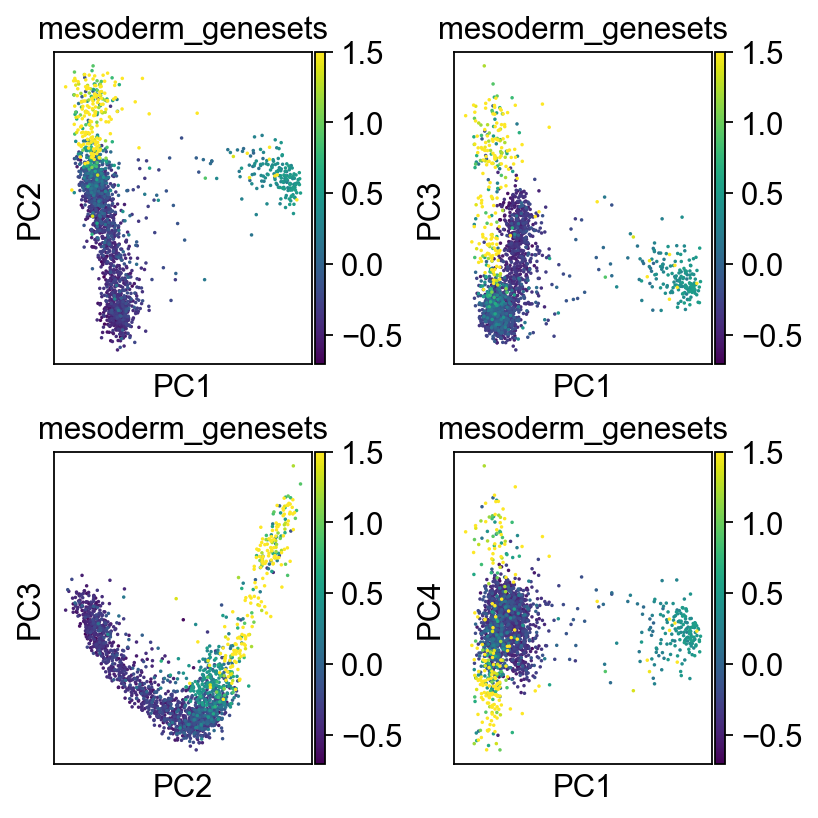

In [59]:
mesoderm = [x.strip() for x in open("genes_mesoderm.csv")]
mesoderm = [x for x in mesoderm if x in unprocessed_MEFless.var_names]

sc.tl.score_genes(unprocessed_MEFless, gene_list = mesoderm, score_name = "mesoderm_genesets")

fig, axs = plt.subplots(2,2, figsize=(5,5), constrained_layout=True)
sc.pl.pca_scatter(unprocessed_MEFless, ax=axs[0,0], color = "mesoderm_genesets", show=False, size=10, vmax = 1.5)
sc.pl.pca_scatter(unprocessed_MEFless, components="1,3", ax=axs[0,1], color = "mesoderm_genesets", show=False, size=10, vmax = 1.5)
sc.pl.pca_scatter(unprocessed_MEFless, components="2,3", ax=axs[1,0], color = "mesoderm_genesets", show=False, size=10, vmax = 1.5)
sc.pl.pca_scatter(unprocessed_MEFless, components="1,4", ax=axs[1,1], color = "mesoderm_genesets", show=False, size=10, vmax = 1.5)

In [60]:
unprocessed_MEFless.obs['cell_type_label'] = None 
unprocessed_MEFless.obs.loc[unprocessed_MEFless.obs['leiden'] == '2', 'cell_type_label'] = 'Naive Pluripotent'
unprocessed_MEFless.obs.loc[unprocessed_MEFless.obs['leiden'] == '1', 'cell_type_label'] = 'Primed Pluripotent'
unprocessed_MEFless.obs.loc[unprocessed_MEFless.obs['leiden'] == '0', 'cell_type_label'] = 'Primitive Streak'
unprocessed_MEFless.obs.loc[unprocessed_MEFless.obs['leiden'] == '3', 'cell_type_label'] = 'Mesoderm'
unprocessed_MEFless.obs.loc[unprocessed_MEFless.obs['leiden'] == '4', 'cell_type_label'] = 'Other'

... storing 'cell_type_label' as categorical


<AxesSubplot:title={'center':'cell_type_label'}, xlabel='PC1', ylabel='PC4'>

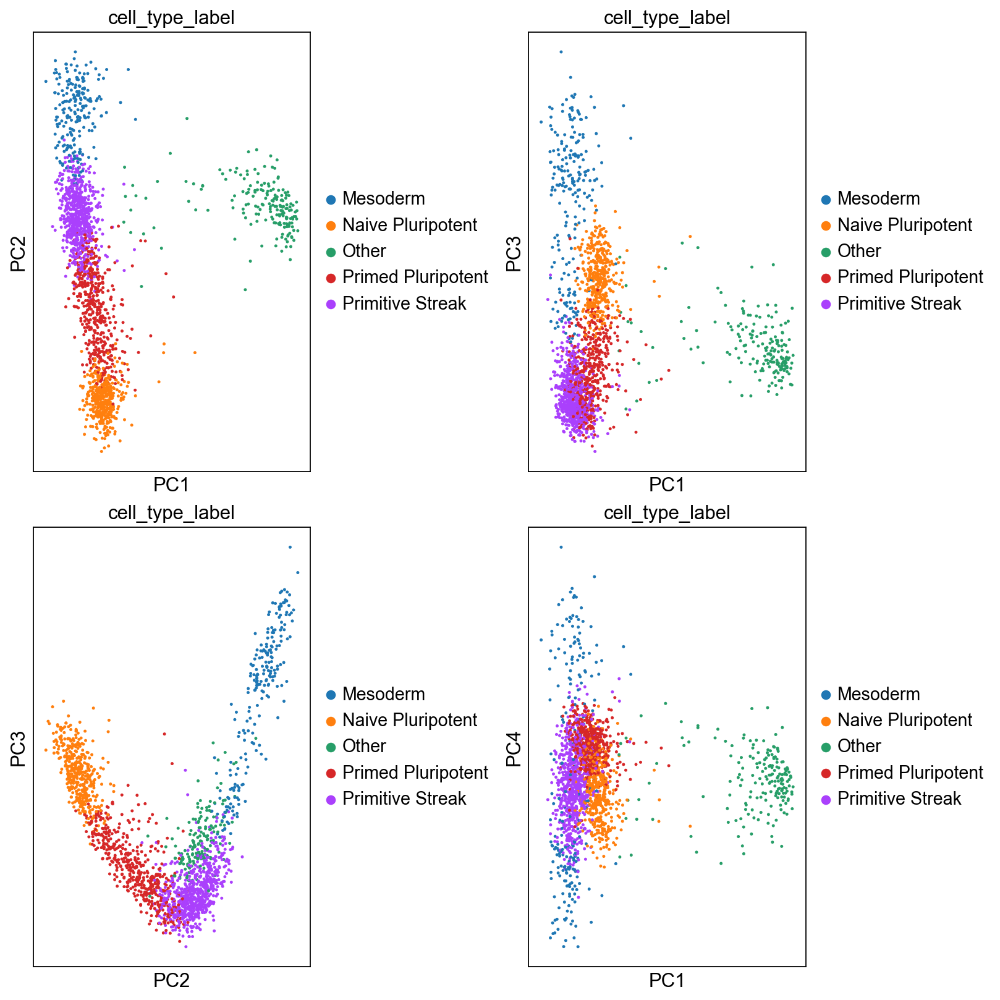

In [61]:
fig, axs = plt.subplots(2,2, figsize=(10,10), constrained_layout=True)
sc.pl.pca_scatter(unprocessed_MEFless, ax=axs[0,0], color = "cell_type_label", show=False, size=20, vmax = 1.5)
sc.pl.pca_scatter(unprocessed_MEFless, components="1,3", ax=axs[0,1], color = "cell_type_label", show=False, size=20, vmax = 1.5)
sc.pl.pca_scatter(unprocessed_MEFless, components="2,3", ax=axs[1,0], color = "cell_type_label", show=False, size=20, vmax = 1.5)
sc.pl.pca_scatter(unprocessed_MEFless, components="1,4", ax=axs[1,1], color = "cell_type_label", show=False, size=20, vmax = 1.5)

### Your mission: Part 4

Predict the stage of cell cycle of each cell. Use this information to address question (A) above: 

*To what extent do the proportion of cells at each stage of cell cycle (CC) differ during directed differentiation?*

In [62]:
###  Part 4 code, figures and explanatory text goes here and in subsequent cells. Show all code.

In [63]:
processed = unprocessed_MEFless

#### Reading in gene lists

In [64]:
cell_cycle_genes = [x.strip() for x in open("mouseCellCycle_050218.csv")]
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]

# now intersect these with genes present in the annData object
cell_cycle_genes = [x for x in cell_cycle_genes if x in processed.var_names]

s_genes = [x for x in s_genes if x in adata.var_names]
g2m_genes = [x for x in g2m_genes if x in adata.var_names]

#### Calculate cell scores

In [65]:
sc.tl.score_genes_cell_cycle(processed, s_genes=s_genes, g2m_genes=g2m_genes)

#### PCA with cell cycle

In [66]:
processed_cc_genes = processed[:, cell_cycle_genes].copy()
sc.pp.pca(processed_cc_genes,use_highly_variable=False)

... storing 'phase' as categorical


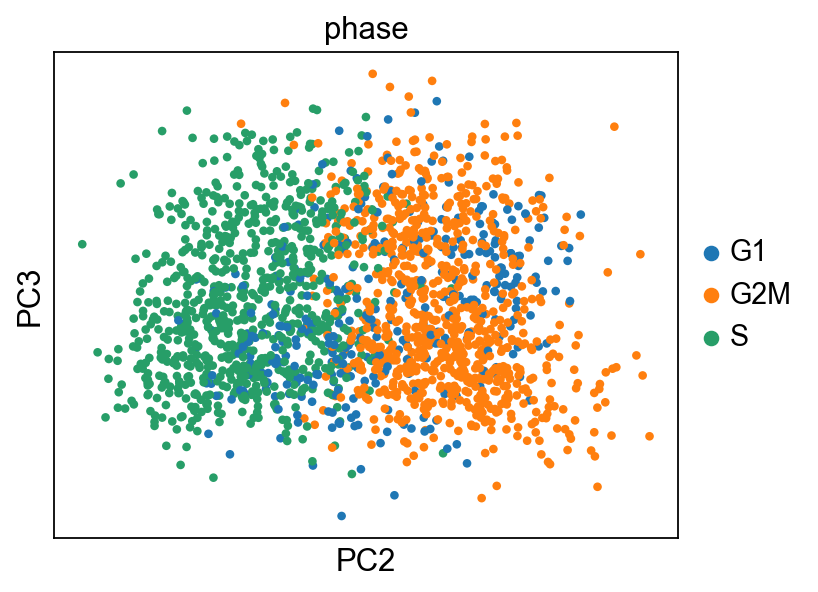

In [67]:
sc.set_figure_params(figsize="5, 4")
sc.pl.pca_scatter(processed_cc_genes, color=["phase"], components="2,3")

... storing 'phase' as categorical


<AxesSubplot:title={'center':'phase'}, xlabel='PC1', ylabel='PC4'>

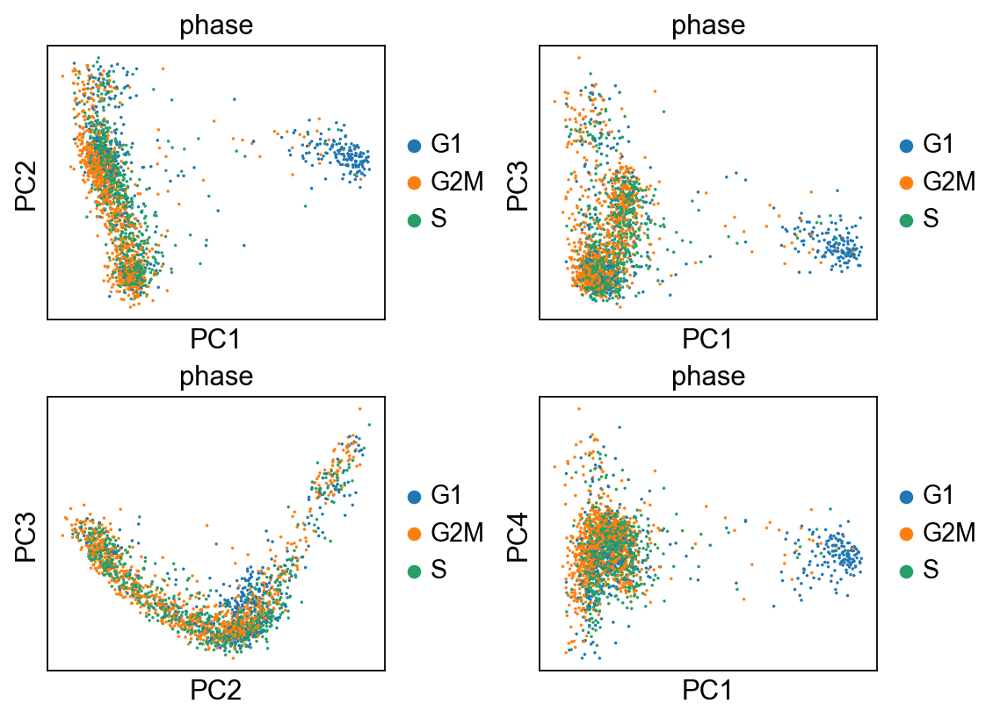

In [68]:
fig, axs = plt.subplots(2,2, figsize=(7,5), constrained_layout=True)
sc.pl.pca_scatter(processed, color="phase", ax=axs[0,0], show=False, size=10)
sc.pl.pca_scatter(processed, color="phase", components="1,3", ax=axs[0,1], show=False, size=10)
sc.pl.pca_scatter(processed, color="phase", components="2,3", ax=axs[1,0], show=False, size=10)
sc.pl.pca_scatter(processed, color="phase", components="1,4", ax=axs[1,1], show=False, size=10)

<AxesSubplot:title={'center':'total_counts'}, xlabel='PC1', ylabel='PC4'>

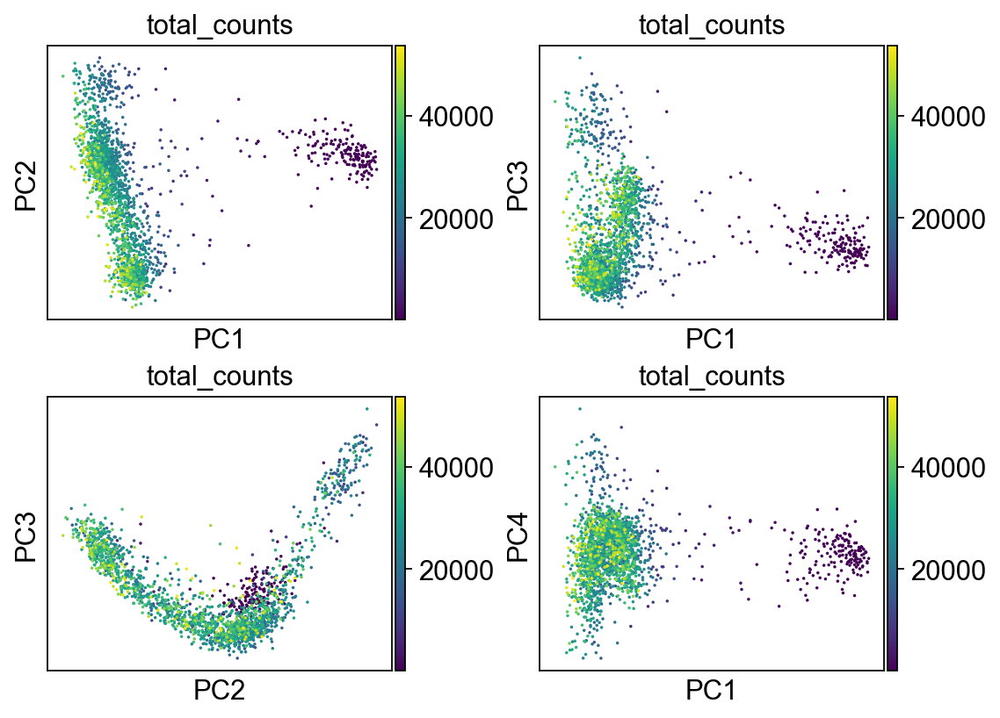

In [69]:
fig, axs = plt.subplots(2,2, figsize=(7,5), constrained_layout=True)
sc.pl.pca_scatter(processed, color="total_counts", ax=axs[0,0], show=False, size=10)
sc.pl.pca_scatter(processed, color="total_counts", components="1,3", ax=axs[0,1], show=False, size=10)
sc.pl.pca_scatter(processed, color="total_counts", components="2,3", ax=axs[1,0], show=False, size=10)
sc.pl.pca_scatter(processed, color="total_counts", components="1,4", ax=axs[1,1], show=False, size=10)

In [70]:
G1 = processed[processed.obs['phase'] == 'G1']
G2M = processed[processed.obs['phase'] == 'G2M']
S = processed[processed.obs['phase'] == 'S']

In [71]:
G2M.obs

,n_genes_by_counts,total_counts,total_counts_ribo,pct_counts_ribo,total_counts_mt,pct_counts_mt,MEF_genesets,leiden,cell_type_label,naive_genesets,primed_genesets,primitive_streak_genesets,mesoderm_genesets,S_score,G2M_score,phase
AACAAGACAATGTTGC,350,436.0,74.0,16.972477,10.0,2.293578,-0.055,4,Other,0.007672,1.932429,0.693733,1.818403,-0.511462,0.035660,G2M
AATCACGTCGACGACC,5920,51203.0,13795.0,26.941782,506.0,0.988223,-6.265,2,Naive Pluripotent,1.087654,-0.898649,-0.875533,-0.238707,-0.348988,0.191781,G2M
CAAGCTATCGTAACTG,6745,50818.0,11532.0,22.692745,653.0,1.284978,-7.300,0,Primitive Streak,-0.719112,0.247755,0.856467,0.025649,-0.049019,0.446470,G2M
CATAGACGTCCACAGC,332,403.0,90.0,22.332506,1.0,0.248139,-0.090,4,Other,-0.128016,-0.268401,-0.018106,0.399421,-0.475992,0.428085,G2M
CCTCTCCAGTAGCAAT,472,652.0,156.0,23.926380,8.0,1.226994,-0.080,4,Other,0.007254,-0.164160,-0.059504,0.249836,-0.376105,0.549697,G2M
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTCGATAGACGTCGA,5554,38164.0,9089.0,23.815638,728.0,1.907557,-5.740,2,Naive Pluripotent,1.264164,-0.340961,-0.804952,-0.306864,0.045289,0.351331,G2M
TTTCGATGTGCGAACA,6226,47202.0,11664.0,24.710817,746.0,1.580442,-5.795,0,Primitive Streak,-0.775503,-0.150856,0.603484,-0.196267,-0.059729,0.034064,G2M
TTTCGATTCCCAAGCG,5435,30923.0,7146.0,23.109013,398.0,1.287068,-3.960,0,Primitive Streak,-0.807949,0.314139,0.716370,-0.476174,-0.185446,0.346109,G2M
TTTGACTGTCACTTCC,5767,35729.0,7860.0,21.998936,538.0,1.505780,-3.735,3,Mesoderm,-0.618199,-0.620290,0.682313,4.264479,-0.353992,0.418866,G2M


In [72]:
n_G1 = G1.n_obs
n_G2M = G2M.n_obs
n_S = S.n_obs
n_G1, n_G2M, n_S

(366, 835, 782)

In [73]:
cell_types = ['Naive Pluripotent', 'Primed Pluripotent', 'Primitive Streak', 'Mesoderm', 'Other']
phases = [G1, G2M, S]

df = []

for phase in phases:
    row = []
    n_phase = phase.n_obs
    for c_type in cell_types:
        n_c_type = phase[phase.obs['cell_type_label'] == c_type].n_obs
        percent = n_c_type / n_phase
        row.append(n_c_type / n_phase)
    df.append(row)

table = pd.DataFrame(df)
table = table.transpose()
table.columns = ['G1', 'G2M', 'S']
table.index=['Naive Pluripotent', 'Primed Pluripotent', 'Primitive Streak', 'Mesoderm', 'Other']
table

,G1,G2M,S
Naive Pluripotent,0.087432,0.244311,0.235294
Primed Pluripotent,0.103825,0.240719,0.314578
Primitive Streak,0.270492,0.373653,0.335038
Mesoderm,0.144809,0.108982,0.095908
Other,0.393443,0.032335,0.019182


In [74]:
visualize_G1 = table['G1']
visualize_G2M = table['G2M']
visualize_S = table['S']

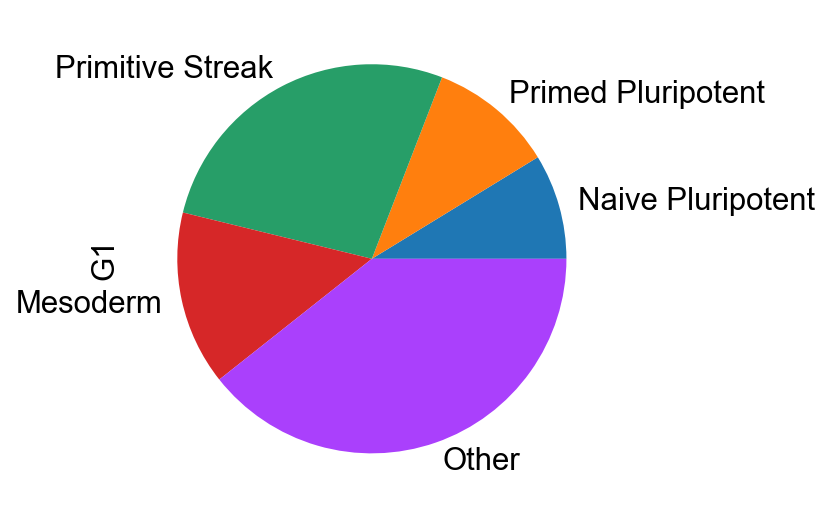

In [75]:
plt.figure()
visualize_G1.plot(kind='pie')
plt.show()

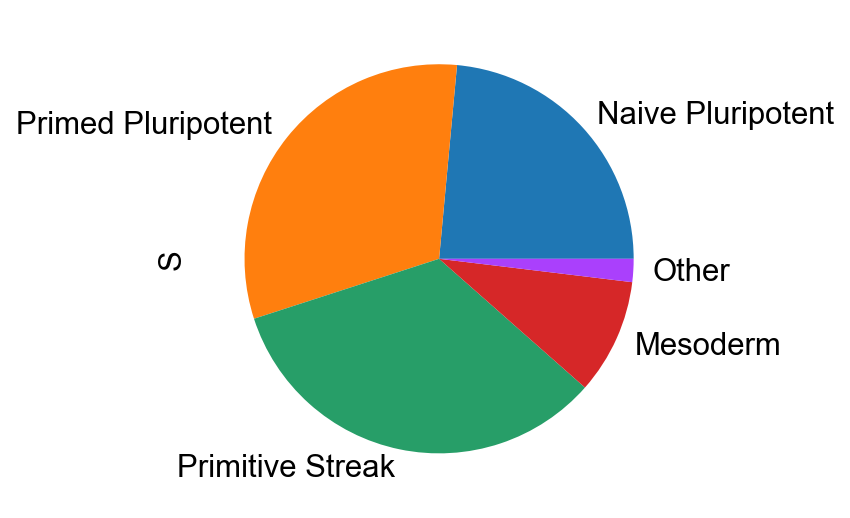

In [76]:
plt.figure()
visualize_S.plot(kind='pie')
plt.show()

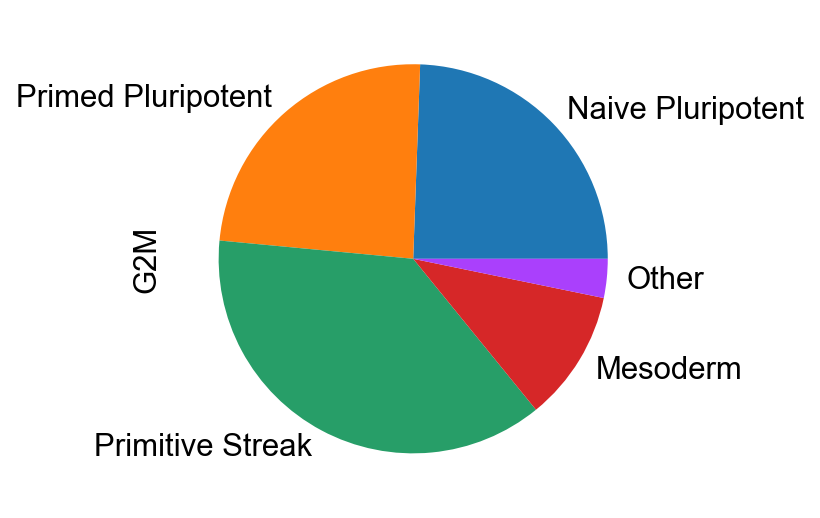

In [77]:
plt.figure()
visualize_G2M.plot(kind='pie')
plt.show()

* Naive pluripotent: Naive pluripotent cells are a small percentage of the G1 phase, then they grow into a larger percentage in the G2M phase, and stays relatively the same percentage in the G2M phase.
* Primed pluripotent: Primed pluripotent cells start as a small percentage of the G1 phase, make up a relatively large percentage of the S phase, and fall somewhat in percentage in the G2M phase.
* Primitive streak: Primitive streak becomes somewhat more abundant towards the G2M phase, but generally stays pretty consistent.
* Mesoderm: Mesoderm is a larger percentage in the G1 phase, before steadily declining for the S and G2M phase.

### Your mission: Part 5

Write a function to identify genes that are correlated with cell cycle stage (S and G2M) scores. You can use Pearson correlation.

Use this function to determine the set of genes that are correlated with S and G2M during each stage of differentation. I recommend using a threshold of 0.45, but feel free to explore and select your own threshold, but if you do so, please justify.

Use the resulting information to answer questions (B) and (C):

(B): What novel genes are associated with CC?

(C):To what extent do these novel CC genes vary across stages of differentiation?

In [78]:
###  Part 5 code, figures and explanatory text goes here and in subsequent cells. Show all code.

In [79]:
def cell_cycle_correlation(adata, threshold = 0.45):
    
    sc.tl.rank_genes_groups(adata,'phase', use_raw=False)
    sc.pl.rank_genes_groups_dotplot(adata, n_genes=25, groupby='phase', groups=['G2M'], use_raw=False, dendrogram=True)
    sc.pl.rank_genes_groups_dotplot(adata, n_genes=25, groupby='phase', groups=['S'], use_raw=False, dendrogram=True)
    G2M_scores = adata.uns['rank_genes_groups']['scores']['G2M'].tolist()
    G2M_names = adata.uns['rank_genes_groups']['names']['G2M'].tolist()
    
    S_scores = adata.uns['rank_genes_groups']['scores']['S']
    S_names = adata.uns['rank_genes_groups']['names']['S']
        
    G2M_genes = []
    for G2M_score, G2M_name in zip(G2M_scores, G2M_names):
        if G2M_score > threshold:
            G2M_genes.append(G2M_name)
            
    S_genes = []
    for S_score, S_name in zip(S_scores, S_names):
        if S_score > threshold:
            S_genes.append(S_name)

    return G2M_genes, S_genes

categories: G1, G2M, S
var_group_labels: G2M


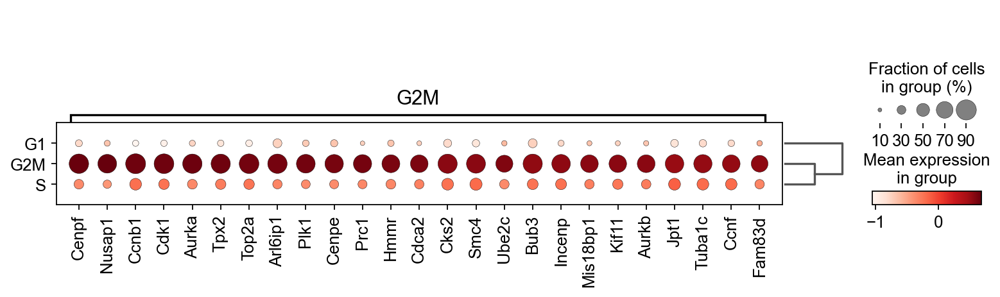

categories: G1, G2M, S
var_group_labels: S


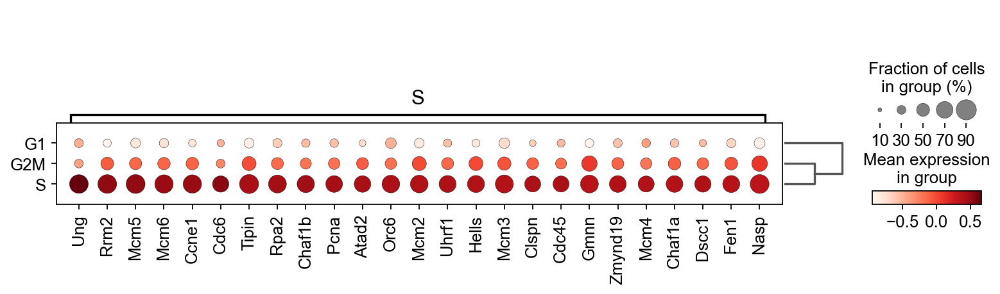

In [80]:
G2_genes, S_genes = cell_cycle_correlation(processed)

In [81]:
novel_G2M = set(G2_genes) - set(g2m_genes)

In [82]:
novel_S = set(S_genes) - set(s_genes)

The novel genes associated with G2M are:

In [83]:
novel_G2M

{'Trim8',
 'Gm9856',
 'Npffr2',
 'Napb',
 'Pmm2',
 'Slc16a2',
 'Rnf34',
 'Wdr31',
 'Gm37401',
 'Gtsf1',
 'Kcnd1',
 'Vsir',
 'Gm26641',
 'Bag3',
 'Xpo7',
 'Amotl1',
 'Pcnt',
 'Arhgap5',
 'Ccdc3',
 'Tecpr1',
 'Usb1',
 'Zfp64',
 'Pex7',
 'Srl',
 'Setd5',
 'Cdk6',
 'Coq4',
 'Nupl2',
 'Arhgap33',
 'Lmo1',
 'Usp9y',
 'Polr2a',
 'Tomm22',
 'Snrnp25',
 'Mat2b',
 'Rgs12',
 'Tmem100',
 'Mlec',
 'Elp4',
 'Gabpb2',
 'Gm3417',
 'Rbm17',
 'Gm14399',
 'Trpt1',
 'Cops6',
 'Med31',
 'Laptm4a',
 'Tmem205',
 'Rexo5',
 'Gm32036',
 'Stk19',
 'Parp12',
 'Prkar2a',
 'Actn4',
 'Set',
 'Luc7l',
 'Dok4',
 'Rufy1',
 'BC005561',
 'Txlng',
 'Ccdc102a',
 'Fmnl3',
 'Tapbpl',
 'Zfp609',
 'Aldoa',
 'Mphosph9',
 'Arl13b',
 'Zfp608',
 'Kif3c',
 'Gpalpp1',
 'Nlrp4c',
 'Ahcyl2',
 'Acin1',
 'Kbtbd4',
 'Dscr3',
 'Hdac5',
 'Kat2b',
 'Kcnn4',
 'Dctpp1',
 'Gm26609',
 'Chchd3',
 'Tbc1d13',
 'Slc25a41',
 'Ddx39',
 'Dnajc15',
 'Pwwp2b',
 'Hace1',
 'Slc37a3',
 'Adcy6',
 'Elp3',
 'Whamm',
 'Tm9sf4',
 'Nudt22',
 'Zscan26',
 'Fbxo32'

The novel genes associated with S are:

In [84]:
novel_S

{'Trim8',
 'Styx',
 'Napb',
 'Pmm2',
 'Wdr31',
 'Gtsf1',
 'Xpo7',
 'Vsig10',
 'Zfp853',
 'Pcnt',
 'Arhgap5',
 'Usb1',
 'Srl',
 'Pex7',
 'Zfp64',
 'Setd5',
 'Coq4',
 'Gm45151',
 'Polr2a',
 'Tomm22',
 'Rev3l',
 'Zfp626',
 'Snrnp25',
 'Pnpla2',
 'Mat2b',
 'Pdia6',
 'Mlec',
 'Elp4',
 'Kcnj14',
 'Rbm17',
 'Dhrs13os',
 'Adgrg5',
 'Cops6',
 'Laptm4a',
 'Tmem205',
 'Stk19',
 'Plcb3',
 'Prkar2a',
 'Tubgcp6',
 'Actn4',
 'Set',
 'Luc7l',
 'Pank3',
 'Rufy1',
 'BC005561',
 'Fmnl3',
 'Abcc1',
 'Aldoa',
 'Arl13b',
 'Hpdl',
 'Acin1',
 'Ahcyl2',
 'Hdac5',
 'Kat2b',
 'Dctpp1',
 'Chchd3',
 'Tbc1d13',
 'Slc25a25',
 'Slc25a41',
 'Ddx39',
 'Dnajc15',
 'Fgf2',
 'Elmsan1',
 'Spindoc',
 'Klhl40',
 'Elp3',
 'Tubb4b',
 'Whamm',
 'Rsph3b',
 'Gm38250',
 'Sdc1',
 'Pard6b',
 'Slc23a4',
 'Kctd4',
 'Crls1',
 'Fam120b',
 'Brwd1',
 'C030010L15Rik',
 'Ube2d3',
 'Mastl',
 'Manba',
 'Ucn',
 'Osr2',
 'Thap7',
 'Scp2',
 'Ctr9',
 'Tmem177',
 'Clcc1',
 'Sumo1',
 'Hbegf',
 'Dhx16',
 'Clns1a',
 'Ankrd17',
 'Egfl7',
 'Gm48933',
 

In [85]:
len(novel_G2M)

10983

In [86]:
len(novel_S)

8666

There are more novel genes associated with the G2M phase than there are with the S phase. 

### Your mission: Part 6

Go back and re-do your analysis of the MEF-depleted cells, but this time evaluate how the major cleaning steps impact ...
- the predicted stage of differentiation
- the predicted stage of CC, and how this varies by stage of differentiation
- the identification of novel CC genes, and the extent to which they vary across stage of differentiation.


In [87]:
###  Part 6 code, figures and explanatory text goes here and in subsequent cells. Show all code.

In [122]:
def preprocess_pipeline(raw_annData, exclude_high_mito = True, exclude_high_ribo = True, exclude_low_ribo = True,
                       doublet_threshold = 98, exclude_uninformative = True, exclude_sporadic = True, sporadic_thresh = 5):
    
    adata = raw_annData.copy()
    adata.var['mt']= adata.var_names.str.startswith(("mt-"))
    adata.var['ribo'] = adata.var_names.str.startswith(("Rps","Rpl"))
    sc.pp.calculate_qc_metrics(adata, qc_vars=['ribo', 'mt'], percent_top=None, log1p=False, inplace=True)
    
    thresh = np.percentile(adata.obs['total_counts'], doublet_threshold)
    adata = adata[adata.obs['total_counts'] < thresh, :]
    
    if exclude_high_mito == True:
        adata = adata[adata.obs['pct_counts_mt'] < 60, :]
    if exclude_high_ribo == True:
        adata = adata[adata.obs['pct_counts_ribo'] < 35, :]
    if exclude_low_ribo == True:
        adata = adata[adata.obs['pct_counts_ribo'] > 10, :]
    if exclude_sporadic == True:
        sc.pp.filter_genes(adata, min_cells=sporadic_thresh)
    if exclude_uninformative == True:
        mito_genes = adata.var_names.str.startswith('mt-')
        ribo_genes = adata.var_names.str.startswith(("Rpl","Rps"))
        malat_gene = adata.var_names.str.startswith("Malat1")

        remove = np.add(mito_genes, ribo_genes)
        remove = np.add(remove, malat_gene)
        keep = np.invert(remove)

        adata = adata[:,keep].copy()
    
    
    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)
    sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=4, min_disp=0.25)
    sc.pp.scale(adata, max_value=10)
    
    sc.tl.pca(adata, n_comps=100)
    
    n_pcs = 15
    n_neighbors = 25
    sc.pp.neighbors(adata, n_neighbors=n_neighbors, n_pcs=n_pcs)
    sc.tl.leiden(adata, .3)

    adata.obs['cell_type_label'] = None 
    adata.obs.loc[adata.obs['leiden'] == '2', 'cell_type_label'] = 'Naive Pluripotent'
    adata.obs.loc[adata.obs['leiden'] == '1', 'cell_type_label'] = 'Primed Pluripotent'
    adata.obs.loc[adata.obs['leiden'] == '0', 'cell_type_label'] = 'Primitive Streak'
    adata.obs.loc[adata.obs['leiden'] == '3', 'cell_type_label'] = 'Mesoderm'
    adata.obs.loc[adata.obs['leiden'] == '4', 'cell_type_label'] = 'Other'
    
    fig, axs = plt.subplots(2,2, figsize=(10,10), constrained_layout=True)
    sc.pl.pca_scatter(adata, ax=axs[0,0], color = "cell_type_label", show=False, size=20, vmax = 1.5)
    sc.pl.pca_scatter(adata, components="1,3", ax=axs[0,1], color = "cell_type_label", show=False, size=20, vmax = 1.5)
    sc.pl.pca_scatter(adata, components="2,3", ax=axs[1,0], color = "cell_type_label", show=False, size=20, vmax = 1.5)
    sc.pl.pca_scatter(adata, components="1,4", ax=axs[1,1], color = "cell_type_label", show=False, size=20, vmax = 1.5)
    
    cell_cycle_genes = [x.strip() for x in open("mouseCellCycle_050218.csv")]
    s_genes = cell_cycle_genes[:43]
    g2m_genes = cell_cycle_genes[43:]
    cell_cycle_genes = [x for x in cell_cycle_genes if x in processed.var_names]
    s_genes = [x for x in s_genes if x in adata.var_names]
    g2m_genes = [x for x in g2m_genes if x in adata.var_names]
    
    sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)
    
    cc_genes = adata[:, cell_cycle_genes].copy()
    sc.pp.pca(cc_genes,use_highly_variable=False)
    
    fig, axs = plt.subplots(2,2, figsize=(7,5), constrained_layout=True)
    sc.pl.pca_scatter(adata, color="phase", ax=axs[0,0], show=False, size=10)
    sc.pl.pca_scatter(adata, color="phase", components="1,3", ax=axs[0,1], show=False, size=10)
    sc.pl.pca_scatter(adata, color="phase", components="2,3", ax=axs[1,0], show=False, size=10)
    sc.pl.pca_scatter(adata, color="phase", components="1,4", ax=axs[1,1], show=False, size=10)
    
    G1 = adata[adata.obs['phase'] == 'G1']
    G2M = adata[adata.obs['phase'] == 'G2M']
    S = adata[adata.obs['phase'] == 'S']
    
    n_G1 = G1.n_obs
    n_G2M = G2M.n_obs
    n_S = S.n_obs
    n_G1, n_G2M, n_S
    
    cell_types = ['Naive Pluripotent', 'Primed Pluripotent', 'Primitive Streak', 'Mesoderm', 'Other']
    phases = [G1, G2M, S]

    df = []

    for phase in phases:
        row = []
        n_phase = phase.n_obs
        for c_type in cell_types:
            n_c_type = phase[phase.obs['cell_type_label'] == c_type].n_obs
            percent = n_c_type / n_phase
            row.append(n_c_type / n_phase)
        df.append(row)

    table = pd.DataFrame(df)
    table = table.transpose()
    table.columns = ['G1', 'G2M', 'S']
    table.index=['Naive Pluripotent', 'Primed Pluripotent', 'Primitive Streak', 'Mesoderm', 'Other']
    display(table)
    
    visualize_G1 = table['G1']
    visualize_G2M = table['G2M']
    visualize_S = table['S']
    
    plt.figure()
    visualize_G1.plot(kind='pie')
    plt.show()
    
    plt.figure()
    visualize_S.plot(kind='pie')
    plt.show()
    
    plt.figure()
    visualize_G2M.plot(kind='pie')
    plt.show()
    
    G2_genes, S_genes = cell_cycle_correlation(adata)
    
    novel_G2M = set(G2_genes) - set(g2m_genes)
    novel_S = set(S_genes) - set(s_genes)
    
    print("Number of novel G2M genes: " + str(len(novel_G2M)))
    print("Number of novel S genes: " + str(len(novel_S)))

In [123]:
mito = sc.read("adHW2_MEFless.h5ad")

Trying to set attribute `.var` of view, copying.
... storing 'cell_type_label' as categorical
... storing 'phase' as categorical


,G1,G2M,S
Naive Pluripotent,0.087432,0.244311,0.235294
Primed Pluripotent,0.103825,0.240719,0.314578
Primitive Streak,0.270492,0.373653,0.335038
Mesoderm,0.144809,0.108982,0.095908
Other,0.393443,0.032335,0.019182


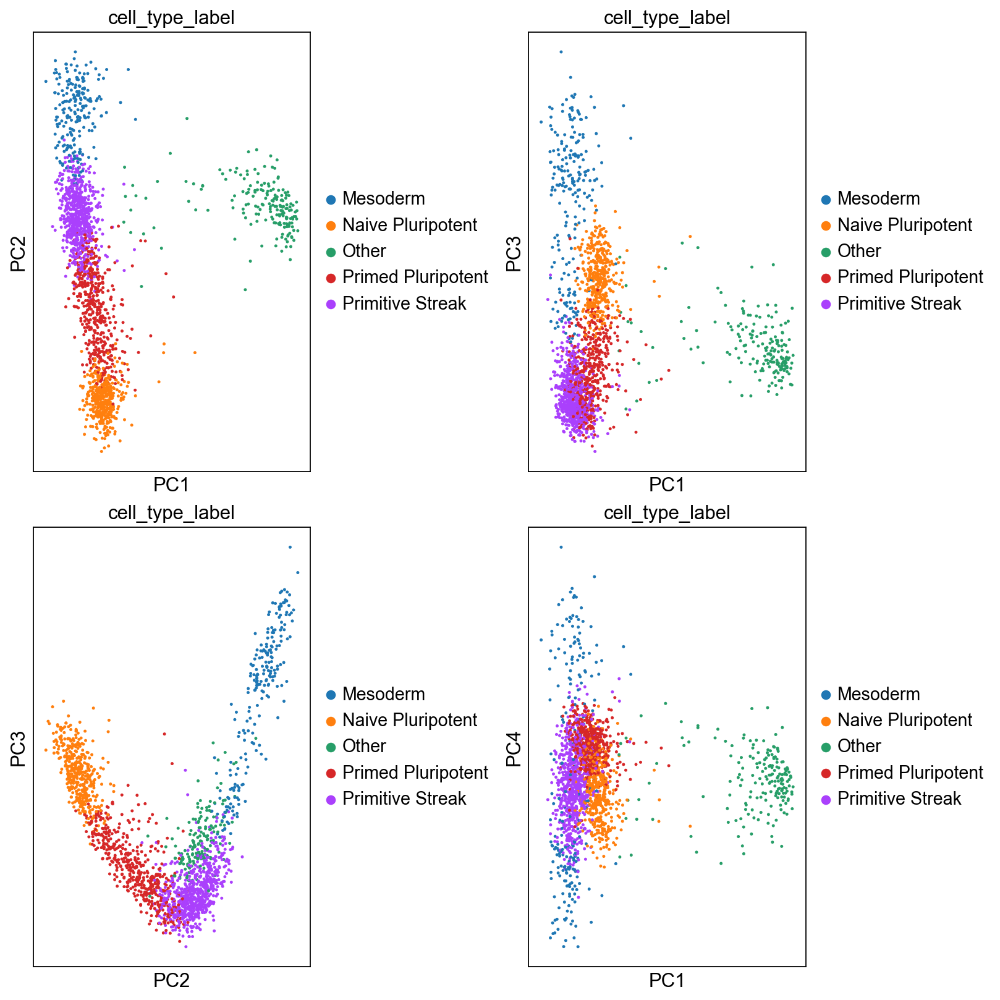

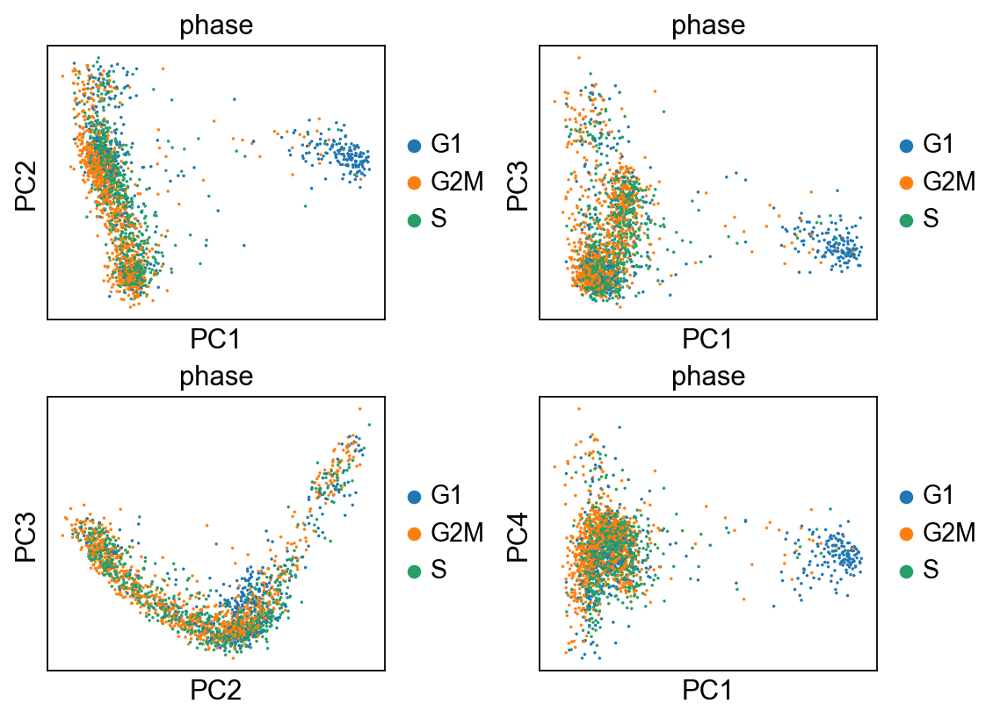

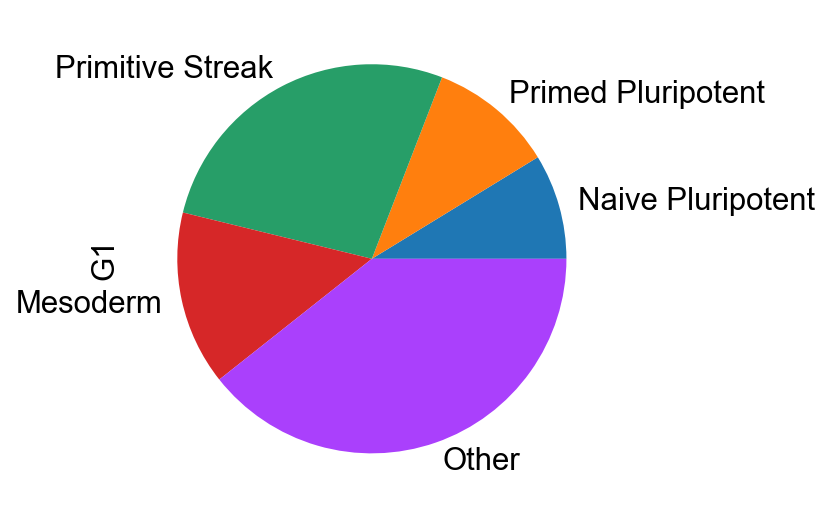

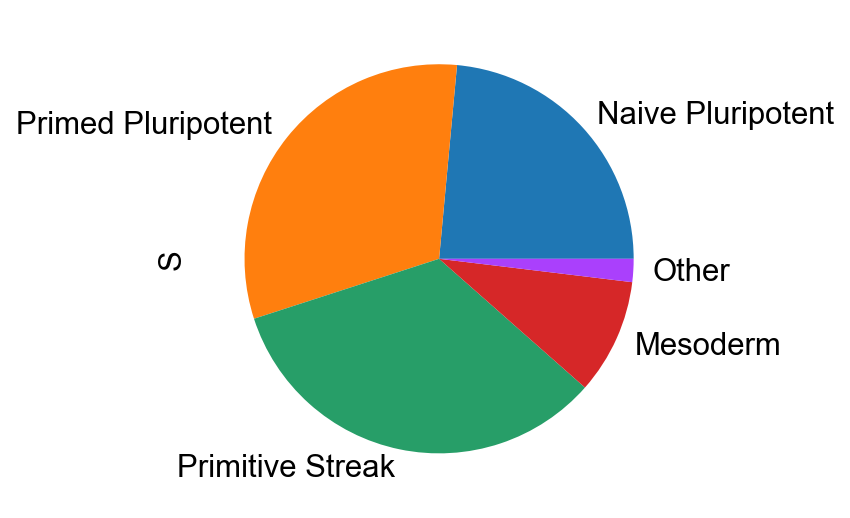

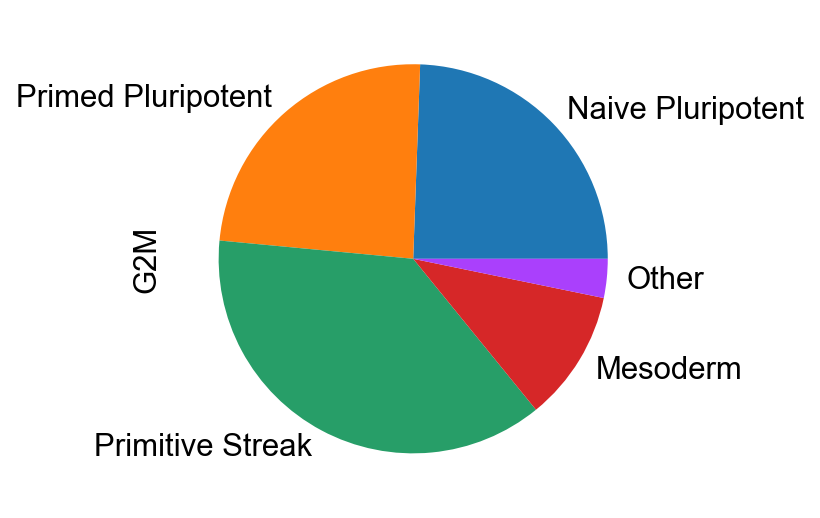

categories: G1, G2M, S
var_group_labels: G2M


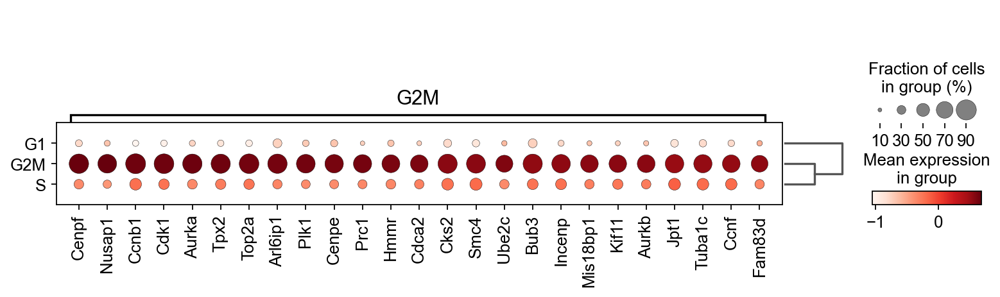

categories: G1, G2M, S
var_group_labels: S


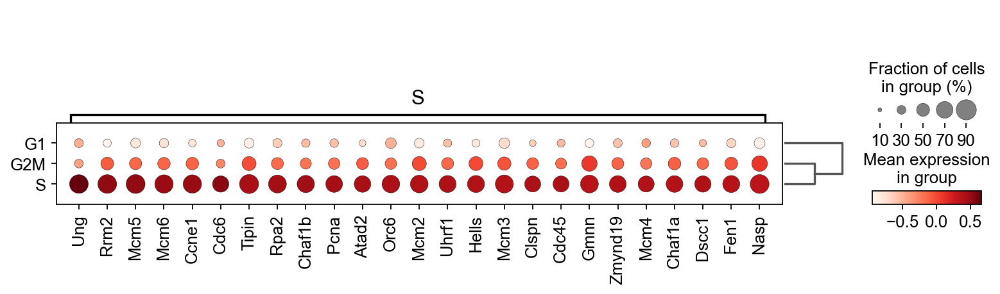

Number of novel G2M genes: 10983
Number of novel S genes: 8666


In [124]:
preprocess_pipeline(mito, exclude_high_mito = False)

In [125]:
ribo = sc.read("adHW2_MEFless.h5ad")

Trying to set attribute `.var` of view, copying.
... storing 'cell_type_label' as categorical
... storing 'phase' as categorical


,G1,G2M,S
Naive Pluripotent,0.087432,0.244311,0.235294
Primed Pluripotent,0.103825,0.240719,0.314578
Primitive Streak,0.270492,0.373653,0.335038
Mesoderm,0.144809,0.108982,0.095908
Other,0.393443,0.032335,0.019182


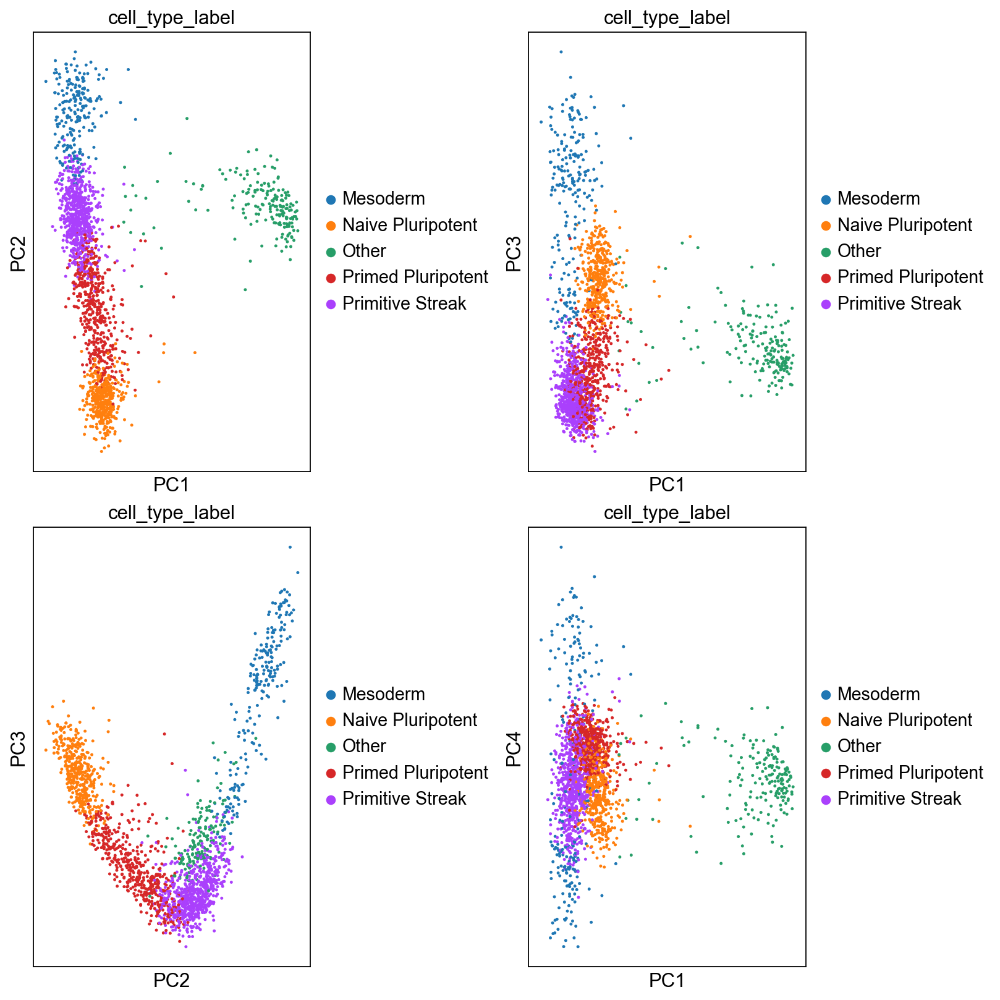

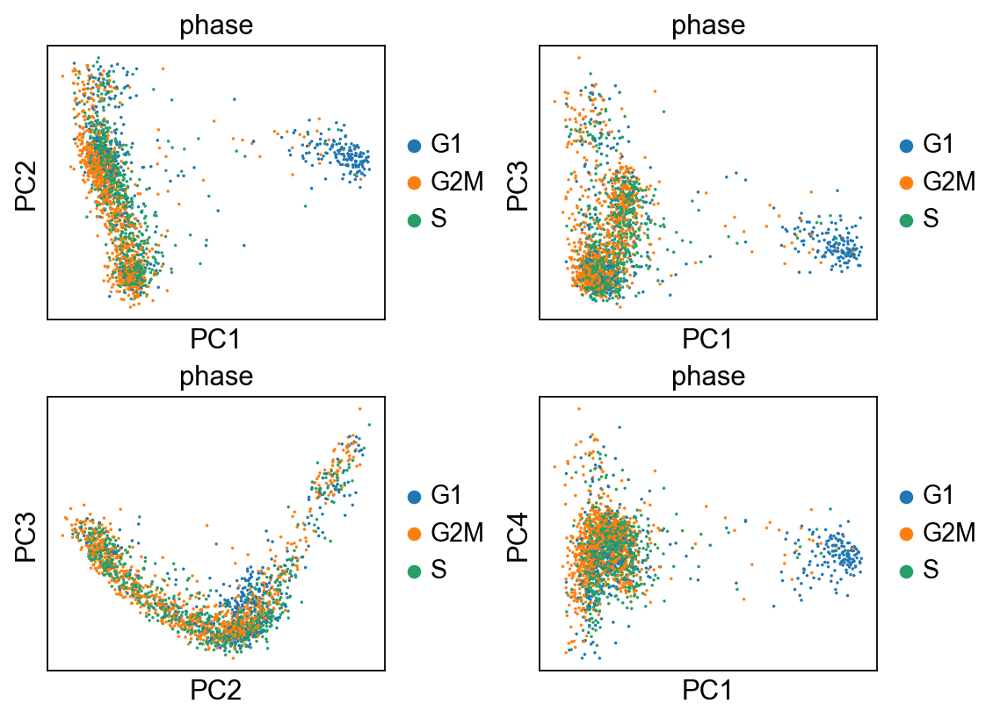

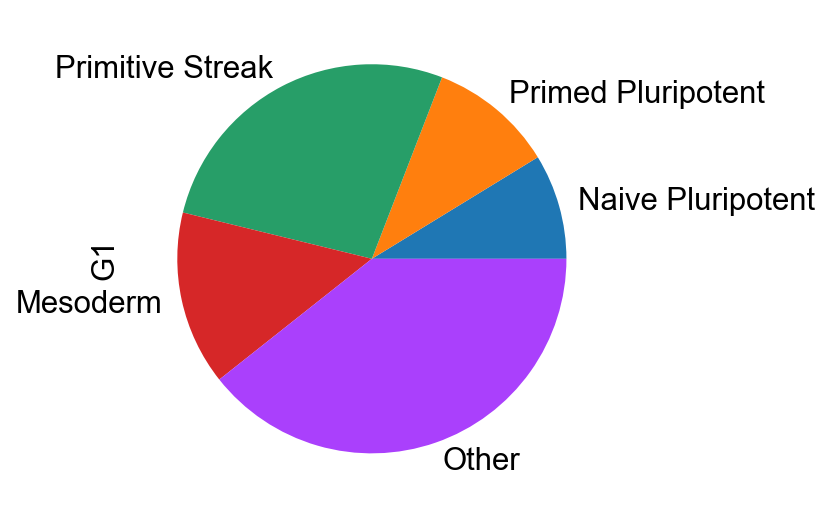

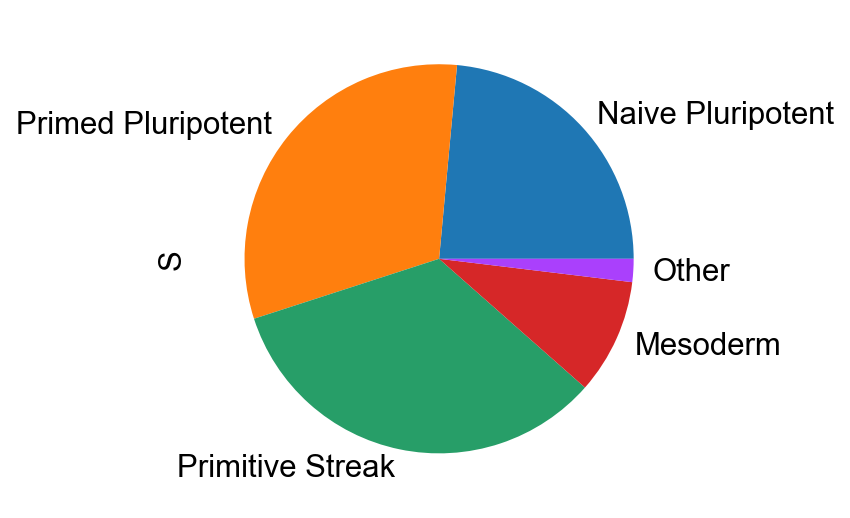

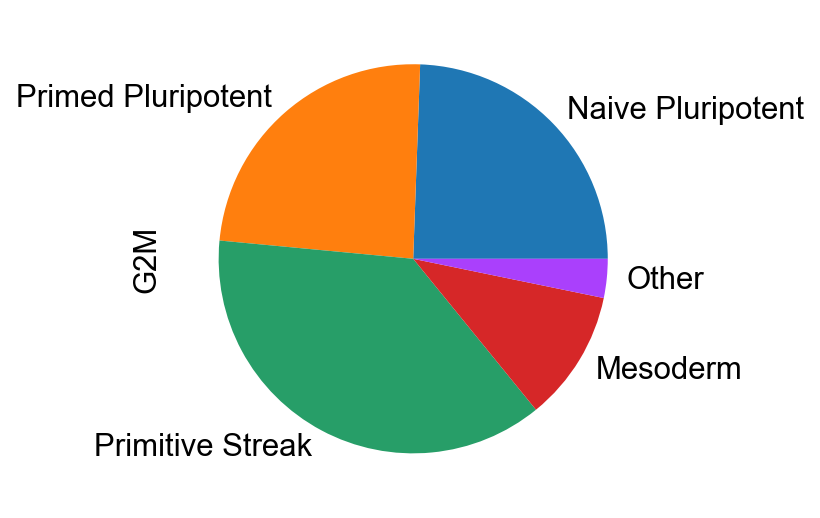

categories: G1, G2M, S
var_group_labels: G2M


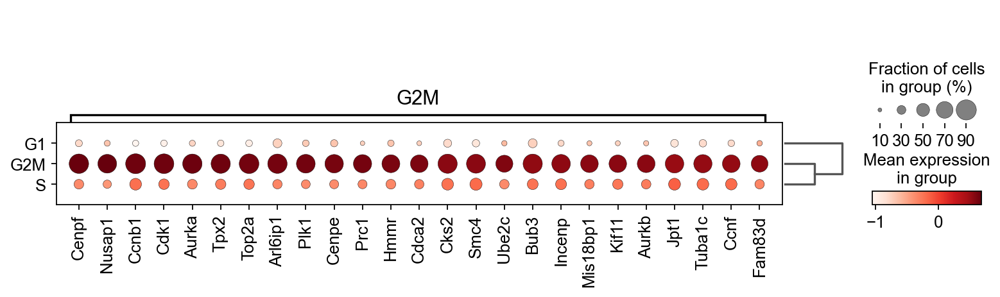

categories: G1, G2M, S
var_group_labels: S


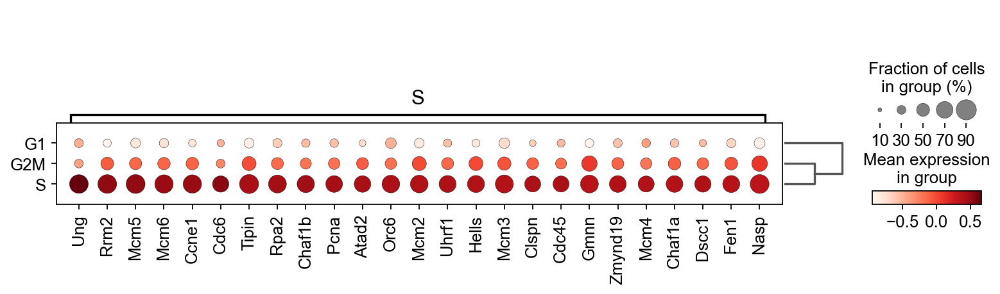

Number of novel G2M genes: 10983
Number of novel S genes: 8666


In [126]:
preprocess_pipeline(ribo, exclude_high_ribo = False, exclude_low_ribo = False)

In [127]:
doublet = sc.read("adHW2_MEFless.h5ad")

Trying to set attribute `.var` of view, copying.
... storing 'cell_type_label' as categorical
... storing 'phase' as categorical


,G1,G2M,S
Naive Pluripotent,0.087209,0.208955,0.264865
Primed Pluripotent,0.075581,0.248304,0.271622
Primitive Streak,0.261628,0.381275,0.348649
Mesoderm,0.145349,0.124830,0.100000
Other,0.430233,0.036635,0.014865


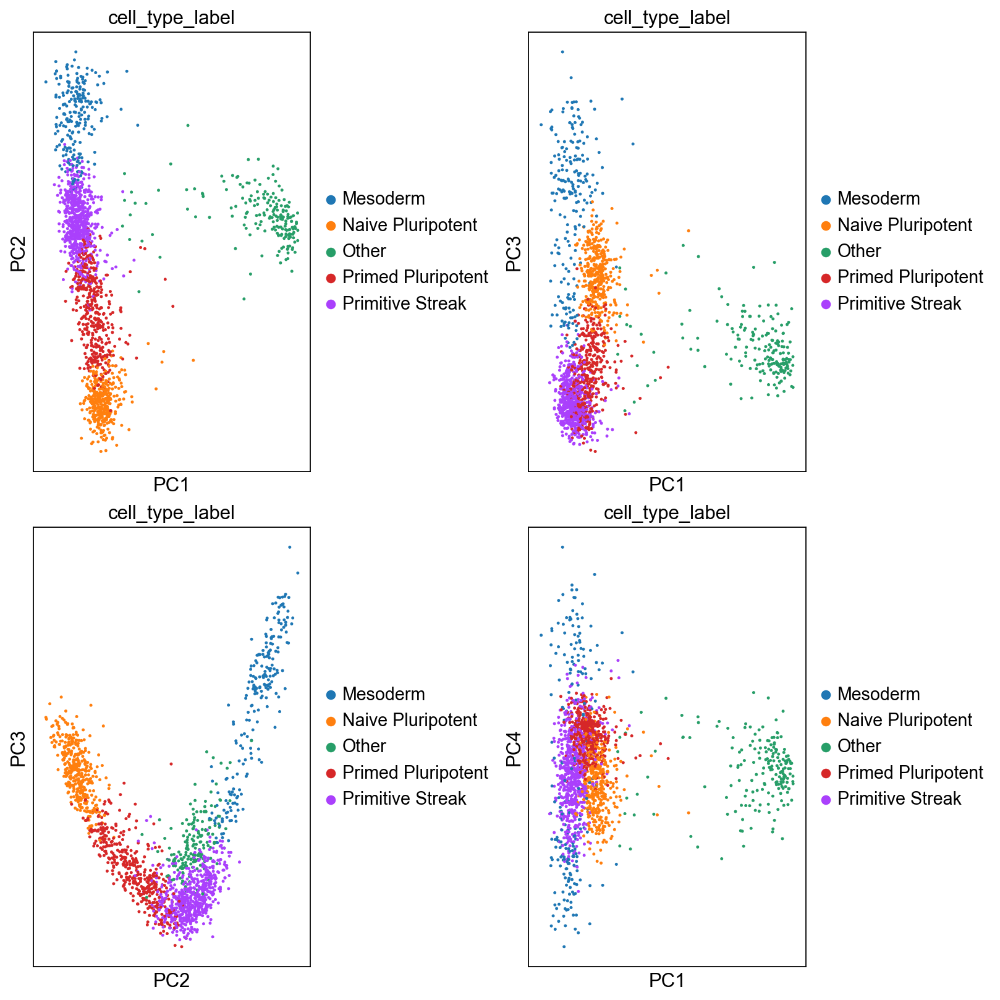

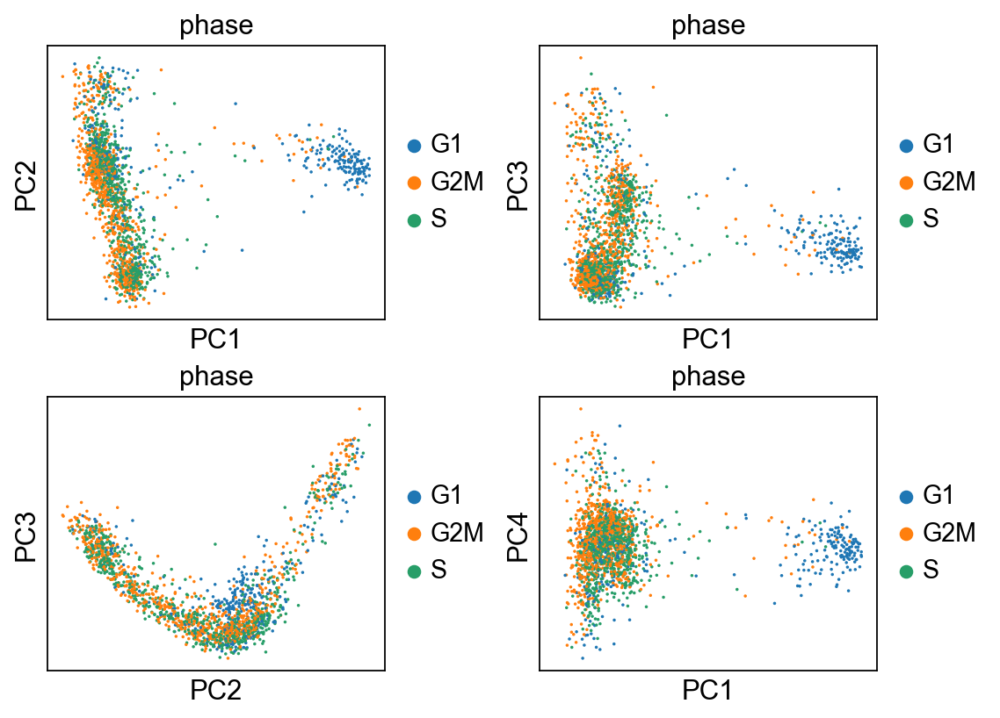

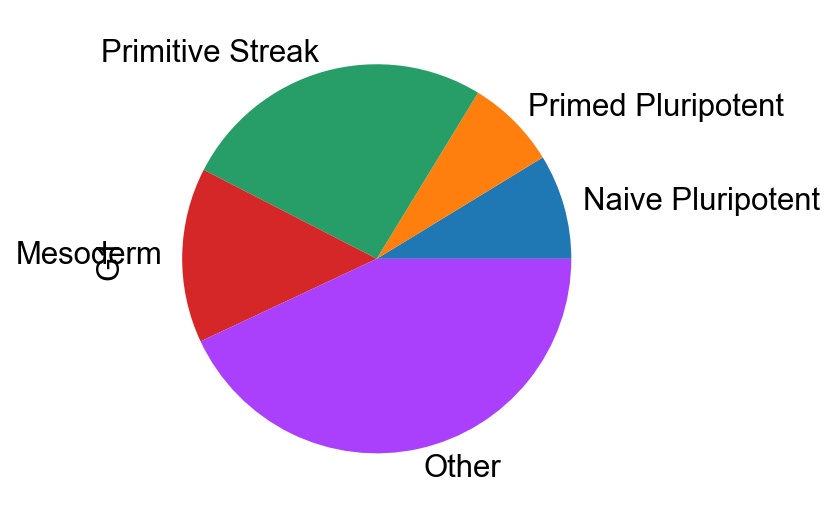

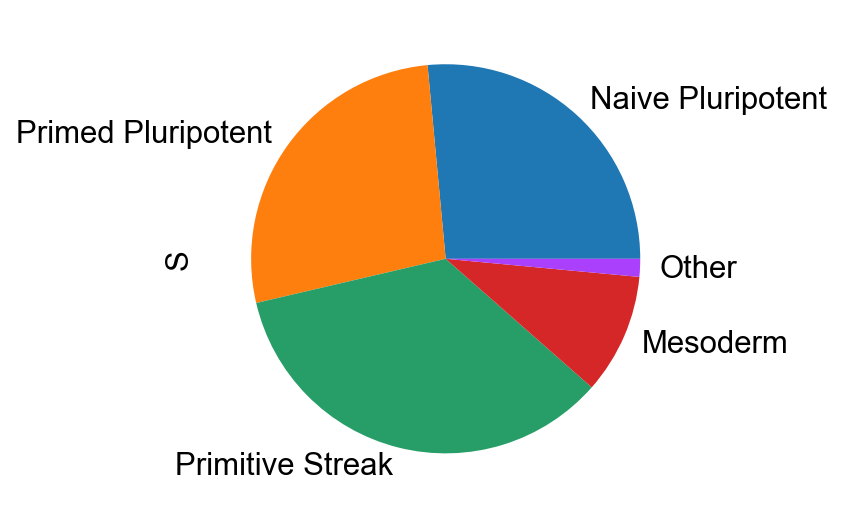

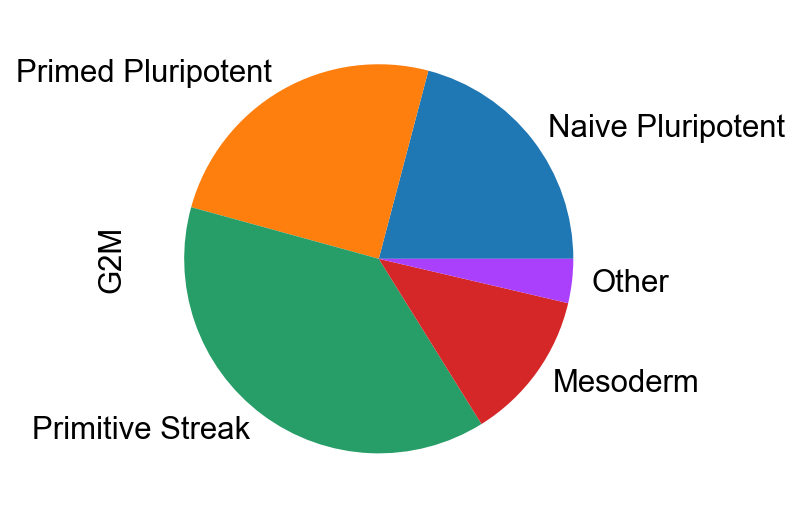

categories: G1, G2M, S
var_group_labels: G2M


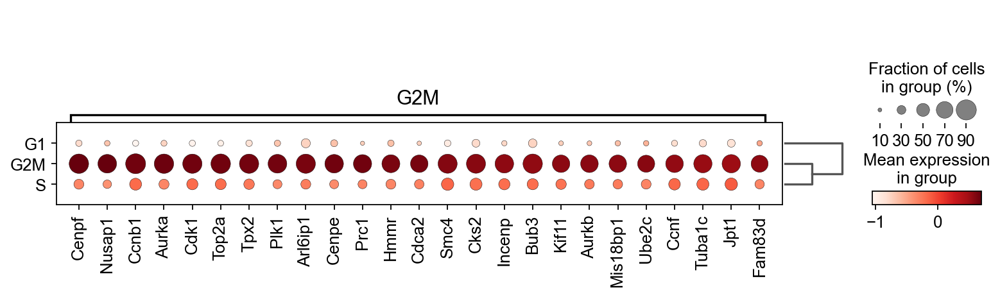

categories: G1, G2M, S
var_group_labels: S


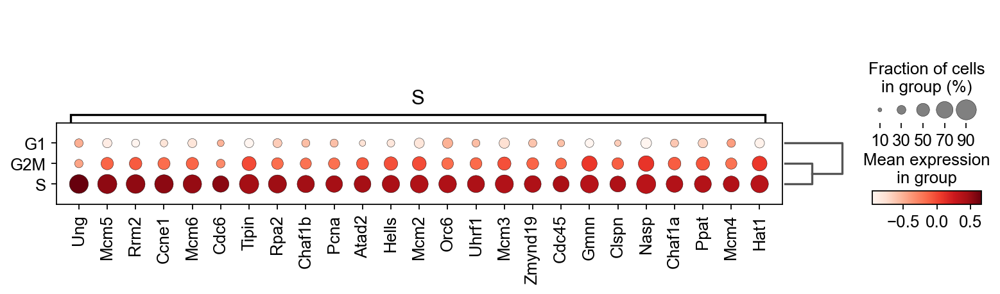

Number of novel G2M genes: 10866
Number of novel S genes: 9024


In [128]:
preprocess_pipeline(doublet, doublet_threshold = 90)

In [129]:
uninformative = sc.read("adHW2_MEFless.h5ad")

... storing 'cell_type_label' as categorical
... storing 'phase' as categorical


,G1,G2M,S
Naive Pluripotent,0.147945,0.110976,0.093985
Primed Pluripotent,0.090411,0.345122,0.343358
Primitive Streak,0.334247,0.519512,0.550125
Mesoderm,0.427397,0.024390,0.012531
Other,0.000000,0.000000,0.000000


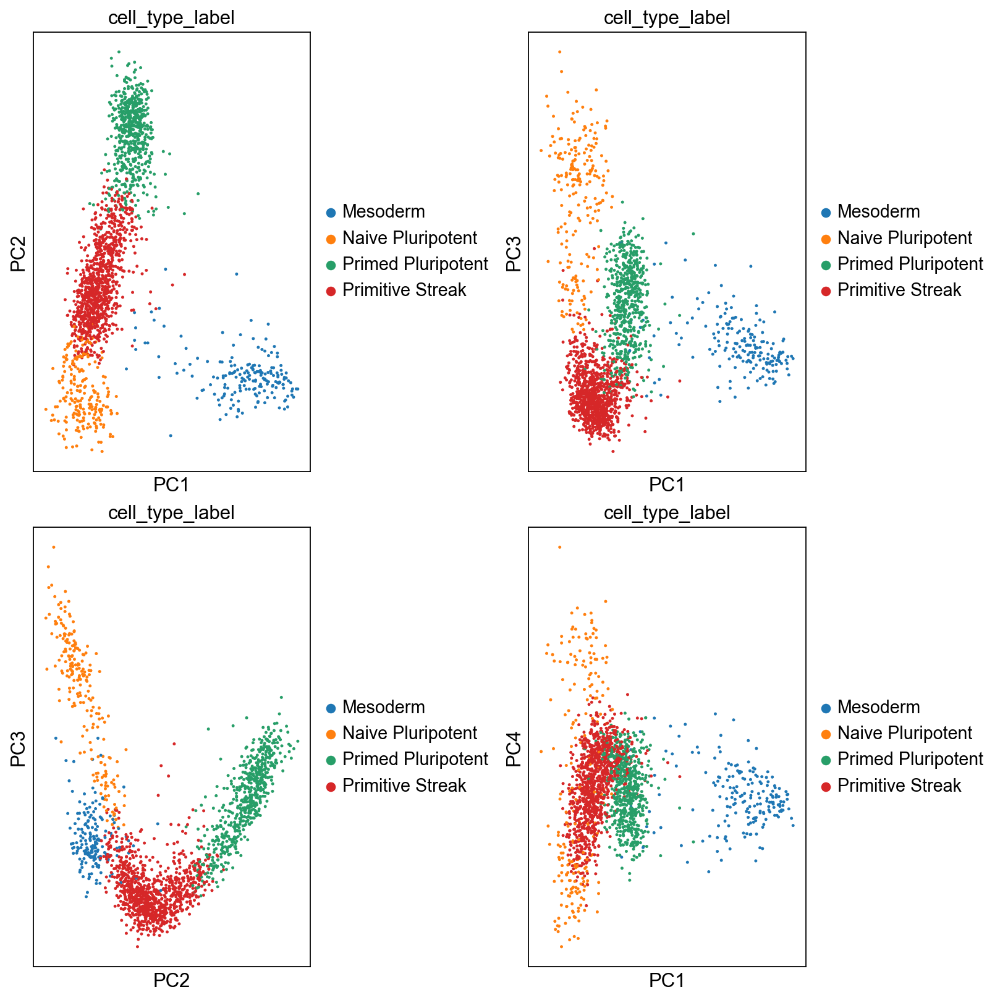

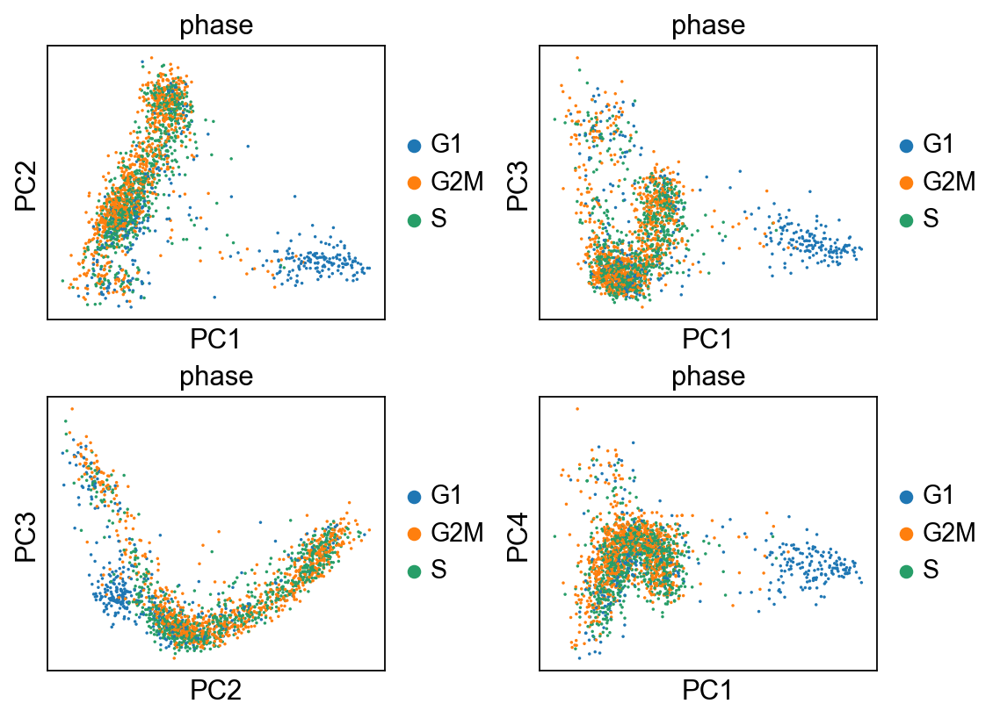

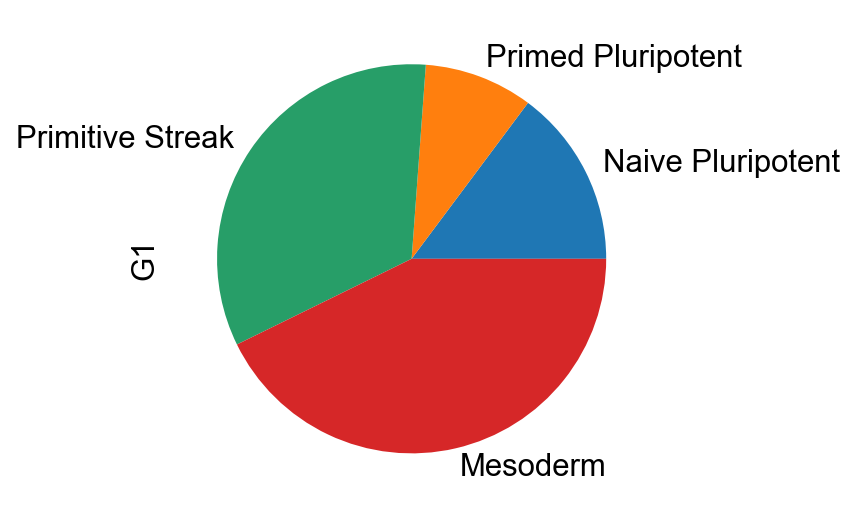

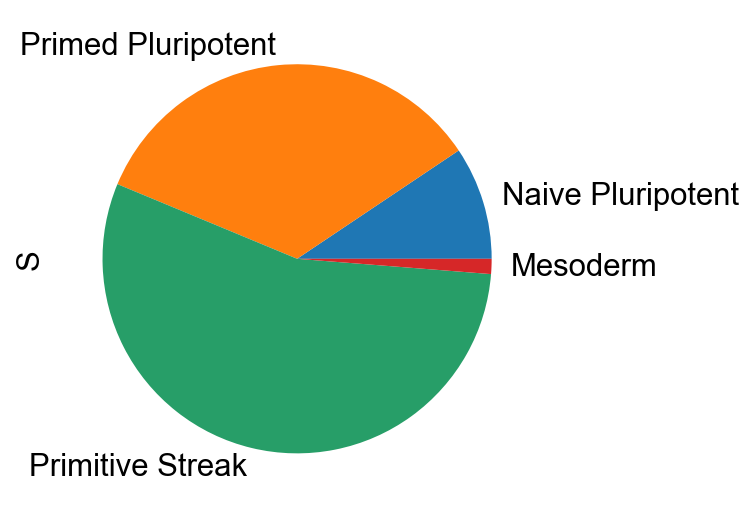

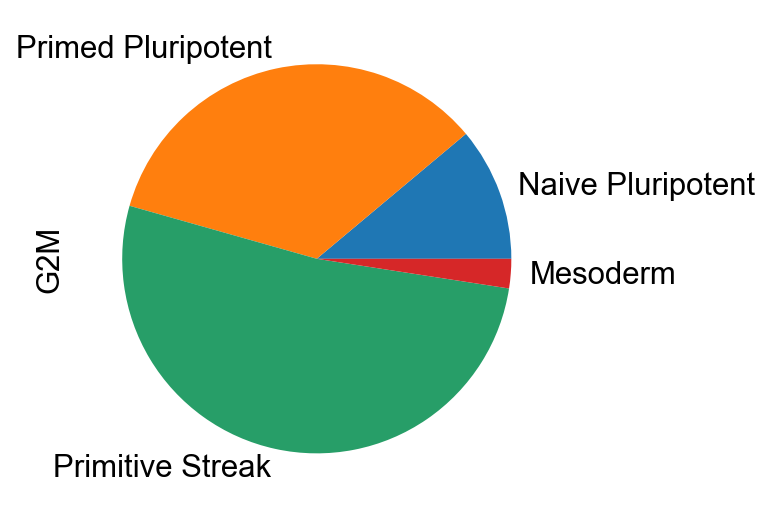

categories: G1, G2M, S
var_group_labels: G2M


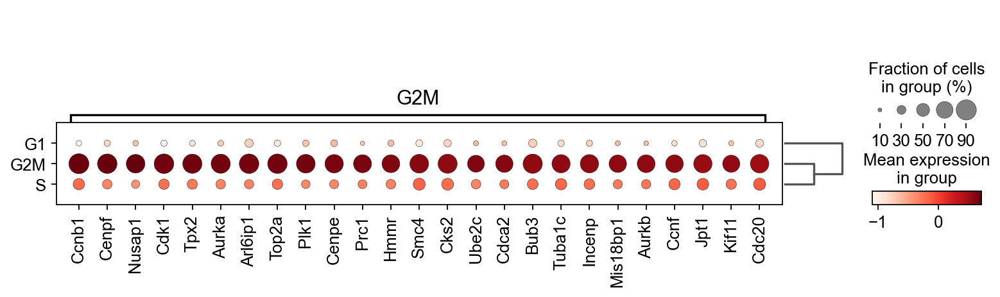

categories: G1, G2M, S
var_group_labels: S


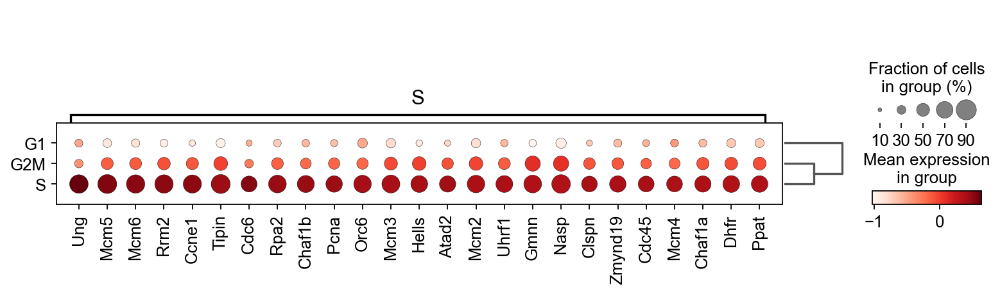

Number of novel G2M genes: 12079
Number of novel S genes: 9995


In [130]:
preprocess_pipeline(uninformative, exclude_uninformative = False, exclude_sporadic = False)

### Cell cycle phase analysis

The preprocessing step that had the biggest effect here was the removal of the uninformative genes. In the other analyses there was a fifth group called other that didn't have a strong inclination towards any particular group. In this analysis, that fifth group got classified into Mesoderm cells, which made mesoderm a much larger portion of G1, and made the primitive streak proportion much higher in S and G2M.

### Cell cycle related genes analysis

The removal of uninformative genes made a difference in the number of novel genes found, but that is probably because the overall number of genes is much higher. The more intersting difference is in the analysis of the doublet threshold. In this run, the lower doublet threshold resulted in a higher number of novel S genes and a lower number of novel G2M genes.